In [ ]:
import tensorflow as tf
from tensorflow import config
import tensorflow.keras.backend as K
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import layers, optimizers, initializers
from tensorflow.keras.callbacks import TensorBoard
from tensorflow.keras.layers import LeakyReLU, BatchNormalization
import numpy as np
import os
import numpy.ma as ma
from sklearn.utils import shuffle
from tensorflow import keras
from tensorflow.keras.layers import Dense, Conv2D, Activation, Flatten, MaxPooling2D

from tensorflow.keras.optimizers import Adam, SGD, RMSprop
from keras.layers.core import Dense, Dropout, Activation, Flatten
import time
import numpy as np
from tensorflow.keras.initializers import random_normal, random_uniform, glorot_normal, glorot_uniform, HeNormal, HeUniform, Zeros
from sklearn.model_selection import train_test_split
from google.colab import files
from netCDF4 import Dataset
import math

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#TRAINING DATA (CMIP6)

In [ ]:
trX=np.load('drive/MyDrive/2.5_18_month_lead/CMIP6_MME_NDJ_2.5_2.5_Input.npy', allow_pickle=True)
trY=np.load('drive/MyDrive/2.5_18_month_lead/CMIP6_MME_Output_yearmean.npy', allow_pickle=True)

# What are the features of the dataset? What does the dimentionality mean?

trX=np.swapaxes(trX, 1, 2)

arr=[]
for i in range(6390):
    input_file=np.zeros((3,24,144), dtype=np.float32)
    input_file[0,:,:]=np.flipud(trX[i,:,:,0])
    input_file[1,:,:]=np.flipud(trX[i,:,:,1])
    input_file[2,:,:]=np.flipud(trX[i,:,:,2])

    arr.append(input_file)

#Why that much preprocessing is done?

trX=np.array(arr)
trX=np.swapaxes(trX,1,3)

In [ ]:
trX.shape

(6390, 144, 24, 3)

#MODEL TRAINING

In [ ]:
num_convf = 32
num_hiddf = 128

weight=initializers.RandomNormal(stddev=0.1)
bias=initializers.RandomUniform(minval=-0.01, maxval=0.01)

trainX, trainY = shuffle(trX, trY, random_state=2)

model=Sequential()

inputshape=(144,24,3)

model.add(Conv2D(num_convf, (8,4), strides=(1,1), kernel_initializer=weight, bias_initializer=bias, padding='SAME'))
model.add(LeakyReLU())
model.add(BatchNormalization())

model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='SAME'))
model.add(Dropout(0.5))

model.add(Conv2D(num_convf, (4,2), strides=(1,1), kernel_initializer=weight, bias_initializer=bias, padding='SAME'))
model.add(LeakyReLU())
model.add(BatchNormalization())

model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='SAME'))
model.add(Dropout(0.5))

model.add(Conv2D(num_convf, (4,2), strides=(1,1), kernel_initializer=weight, bias_initializer=bias, padding='SAME'))
model.add(LeakyReLU())
model.add(BatchNormalization())

model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='SAME'))
model.add(Dropout(0.5))

model.add(Conv2D(num_convf, (2,2), strides=(1,1), kernel_initializer=weight, bias_initializer=bias, padding='SAME'))
model.add(LeakyReLU())
model.add(BatchNormalization())
model.add(Dropout(0.5))


model.add(Flatten())
model.add(Dense(num_hiddf, kernel_initializer=weight, bias_initializer=bias))
model.add(LeakyReLU())
model.add(Dropout(0))


model.add(Dense(1, kernel_initializer=weight, bias_initializer=bias))


model.compile(optimizer=Adam(learning_rate=0.001), loss='mean_squared_error')

checkpoint_filepath = 'model.hdf5'


model_checkpoint_callback = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=50, verbose=1,
                                                              mode='min', restore_best_weights=True)

model.fit(trainX, trainY, epochs=700, batch_size=400)


model.save('Sample_Model.hdf5')
model.save_weights(checkpoint_filepath)
files.download(checkpoint_filepath)

Epoch 1/700
16/16 [==============================] - 52s 3s/step - loss: 14.9613
Epoch 2/700
16/16 [==============================] - 50s 3s/step - loss: 5.4936
Epoch 3/700
16/16 [==============================] - 52s 3s/step - loss: 2.9283
Epoch 4/700
16/16 [==============================] - 50s 3s/step - loss: 2.1225
Epoch 5/700
16/16 [==============================] - 50s 3s/step - loss: 1.7874
Epoch 6/700
16/16 [==============================] - 50s 3s/step - loss: 1.5789
Epoch 7/700
16/16 [==============================] - 52s 3s/step - loss: 1.3970
Epoch 8/700
16/16 [==============================] - 50s 3s/step - loss: 1.2806
Epoch 9/700
16/16 [==============================] - 53s 3s/step - loss: 1.1681
Epoch 10/700
16/16 [==============================] - 50s 3s/step - loss: 1.1300
Epoch 11/700
16/16 [==============================] - 52s 3s/step - loss: 1.0338
Epoch 12/700
16/16 [==============================] - 50s 3s/step - loss: 0.9853
Epoch 13/700
16/16 [================

In [ ]:
A = np.arange(-2.95,3.25,0.02)

In [ ]:
len(A)

array([-2.95, -2.93, -2.91, -2.89, -2.87, -2.85, -2.83, -2.81, -2.79,
       -2.77, -2.75, -2.73, -2.71, -2.69, -2.67, -2.65, -2.63, -2.61,
       -2.59, -2.57, -2.55, -2.53, -2.51, -2.49, -2.47, -2.45, -2.43,
       -2.41, -2.39, -2.37, -2.35, -2.33, -2.31, -2.29, -2.27, -2.25,
       -2.23, -2.21, -2.19, -2.17, -2.15, -2.13, -2.11, -2.09, -2.07,
       -2.05, -2.03, -2.01, -1.99, -1.97, -1.95, -1.93, -1.91, -1.89,
       -1.87, -1.85, -1.83, -1.81, -1.79, -1.77, -1.75, -1.73, -1.71,
       -1.69, -1.67, -1.65, -1.63, -1.61, -1.59, -1.57, -1.55, -1.53,
       -1.51, -1.49, -1.47, -1.45, -1.43, -1.41, -1.39, -1.37, -1.35,
       -1.33, -1.31, -1.29, -1.27, -1.25, -1.23, -1.21, -1.19, -1.17,
       -1.15, -1.13, -1.11, -1.09, -1.07, -1.05, -1.03, -1.01, -0.99,
       -0.97, -0.95, -0.93, -0.91, -0.89, -0.87, -0.85, -0.83, -0.81,
       -0.79, -0.77, -0.75, -0.73, -0.71, -0.69, -0.67, -0.65, -0.63,
       -0.61, -0.59, -0.57, -0.55, -0.53, -0.51, -0.49, -0.47, -0.45,
       -0.43, -0.41,

In [ ]:
opt = np.zeros((((len(A),144,48,3))), dtype=np.float32)

for i in range(len(A)):

    x1 = np.zeros((((1,144,48,3))), dtype=np.float32)
    x1 = tf.Variable(x1)
    y1 = tf.Variable(A[i].reshape(1,1))
    #yp = np.zeros((1,6))

    alpha = 100
    mse = tf.keras.losses.MeanSquaredError()
    loss = 10
    while(loss > 1e-8):

        with tf.GradientTape() as tape:
            # Forward pass
            tape.watch(x1)
            yp = model(x1)
            loss = mse(y1,yp)

        grad = tape.gradient(loss, x1)

        x1 = x1 - alpha*grad

    opt[i] = x1.numpy()

In [ ]:
np.save('opt.npy', opt)

<Figure size 1152x576 with 0 Axes>

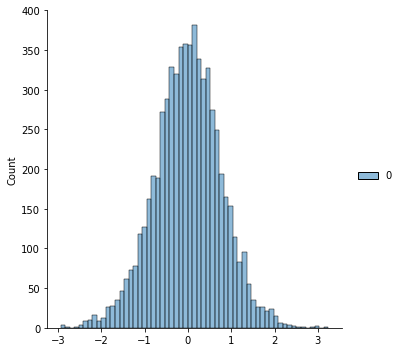

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize = (16,8))
sns.displot(trainY, kind = 'hist')
plt.show()

#RETRAINING DATA (SODA)

In [ ]:
num_convf = 32
num_hiddf = 128

#############################################################################################

#Why retraining is done?

data1=Dataset('drive/MyDrive/18_month_lead/Soda_NDJ_detrend_transfer_1871_1974.nc', 'r')
trX_soda=data1.variables['d20'][:]

trX=[]
for i in range(0,312,3):
    input_file=np.zeros((3,48,144), dtype=np.float32)
    input_file[0,:,:]=np.flipud(trX_soda[i,:,:])
    input_file[1,:,:]=np.flipud(trX_soda[i+1,:,:])
    input_file[2,:,:]=np.flipud(trX_soda[i+2,:,:])

    trX.append(input_file)

trX=np.array(trX)
trX=np.swapaxes(trX,1,3)
trX=ma.masked_values(trX, -9.99e+08)

index_1=[]
for i in range(104):
    index_2=[]
    for j in range(144):
        index_3=[]
        for k in range(48):
            index_4=[]
            for l in range(3):
                val=trX[i,j,k,l]
                if math.isnan(val)==False:
                    index_4.append(val)
                else:
                    index_4.append(0)
            index_3.append(index_4)
        index_2.append(index_3)
    index_1.append(index_2)
trX=np.array(index_1)


data2=Dataset('drive/MyDrive/18_month_lead/JJAS_detrend_transfer_1873_1976.nc','r')
trY=data2.variables['var1'][:]

trY=trY.reshape(104,1)


#############################################################################################

data3=Dataset('drive/MyDrive/18_month_lead/Soda_NDJ_detrend_1979_2009.nc', 'r')
teX_soda=data3.variables['d20'][:]

teX=[]
for i in range(0,93,3):
    input_file=np.zeros((3,48,144), dtype=np.float32)
    input_file[0,:,:]=np.flipud(teX_soda[i,:,:])
    input_file[1,:,:]=np.flipud(teX_soda[i+1,:,:])
    input_file[2,:,:]=np.flipud(teX_soda[i+2,:,:])

    teX.append(input_file)

teX=np.array(teX)
teX=np.swapaxes(teX,1,3)
teX=ma.masked_values(teX, -9.99e+08)

index_1=[]
for i in range(31):
    index_2=[]
    for j in range(144):
        index_3=[]
        for k in range(48):
            index_4=[]
            for l in range(3):
                val=teX[i,j,k,l]
                if math.isnan(val)==False:
                    index_4.append(val)
                else:
                    index_4.append(0)
            index_3.append(index_4)
        index_2.append(index_3)
    index_1.append(index_2)
teX=np.array(index_1)


data4=Dataset('drive/MyDrive/18_month_lead/JJAS_detrend_1981_2011.nc','r')
teY=data4.variables['var1'][:]

teY=teY.reshape(31,1)

##########################################################################################

trainX, trainY = shuffle(trX, trY, random_state=2)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:33: UserWarning: Warning: converting a masked element to nan.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:76: UserWarning: Warning: converting a masked element to nan.


In [ ]:
teX_soda.mask[:31].shape

(31, 48, 144)

In [ ]:
# importing numpy package
import numpy as np
# importing matplotlib package
import matplotlib.pyplot as plt
%matplotlib inline
# creating an empty canvas
fig = plt.figure(figsize=(30,15))

mean_teX=np.mean(teX)
std_teX=np.std(teX)

for lab in range(3):
  # Creating an empty 3D axes of the plot
  ax = fig.add_subplot(1,3,(lab+1),projection='3d')

  # Labeling the X Axis
  ax.set_xlabel('X Axis')

  # Labeling the Y-Axis
  ax.set_ylabel('Y Axis')

  # Labeling the Z-Axis
  ax.set_zlabel('Z Axis')

  for ind in ISMR.loc[ISMR['labels']==lab].index:
    x = []

    # Creating Y as an array of numbers
    # which are square of the numbers
    # in X
    y=[]
    z=[]
    for  i in range(144):
      for j in range(48):
        x.append(i)
        y.append(j)
        z.append((teX[ind,i,j,2]-mean_teX)/std_teX)

    # Creating a 2D data Scatter plot for the
    # on a 3D axis figure
    ax.scatter(x, y,z)

  # Showing the above 3D plot
plt.show()


(31, 144, 48, 3)

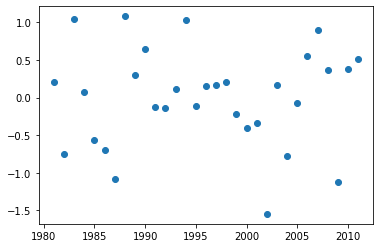

In [ ]:
plt.scatter([i for i in range(1981,2012)],teY)

In [ ]:
!pip install yellowbrick

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


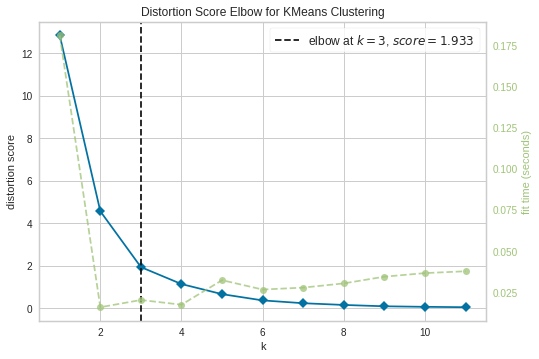

In [ ]:
from yellowbrick.cluster import KElbowVisualizer
from sklearn.cluster import KMeans
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1,12)).fit(teY)
visualizer.show()

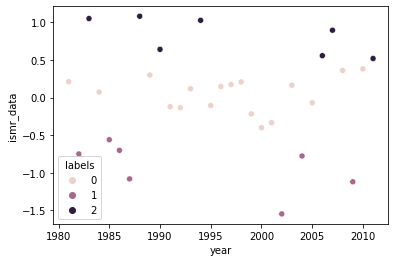

In [ ]:
from sklearn.cluster import KMeans
import pandas as pd
kmeans = KMeans(n_clusters=3, init='k-means++', random_state=0).fit(teY)
import seaborn as sns
import matplotlib.pyplot as plt
ISMR=pd.DataFrame({'ismr_data': teY.flatten(), 'year':[i for i in range(1981,2012)],'labels':kmeans.labels_})
sns.scatterplot(data=ISMR, x="year", y="ismr_data", hue='labels')
plt.show()

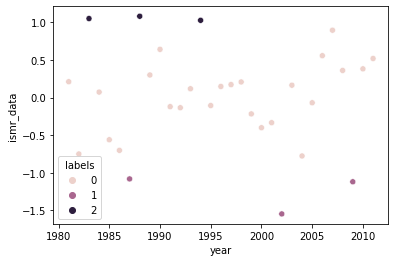

In [ ]:
import pandas as pd
labels=[]
for te in teY.flatten():
  if te<-1.0:
    labels.append(1)
  elif te>1.0:
    labels.append(2)
  else:
    labels.append(0)

import seaborn as sns
import matplotlib.pyplot as plt
ISMR=pd.DataFrame({'ismr_data': teY.flatten(), 'year':[i for i in range(1981,2012)],'labels':np.array(labels)})
sns.scatterplot(data=ISMR, x="year", y="ismr_data", hue='labels')
plt.show()

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  after removing the cwd from sys.path.


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

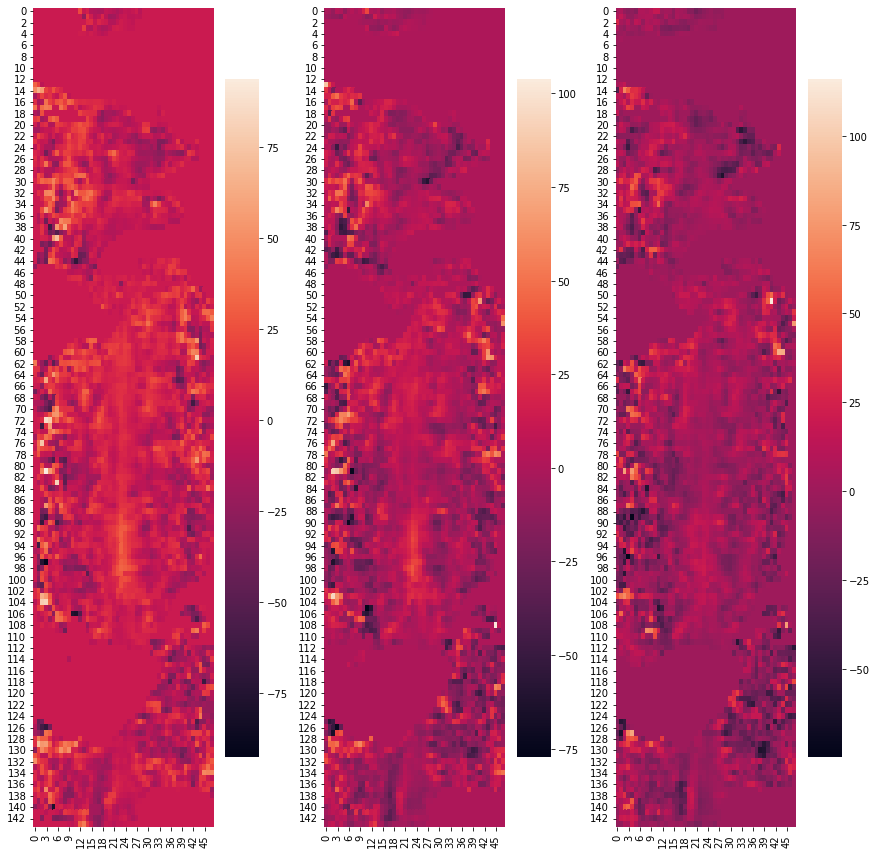

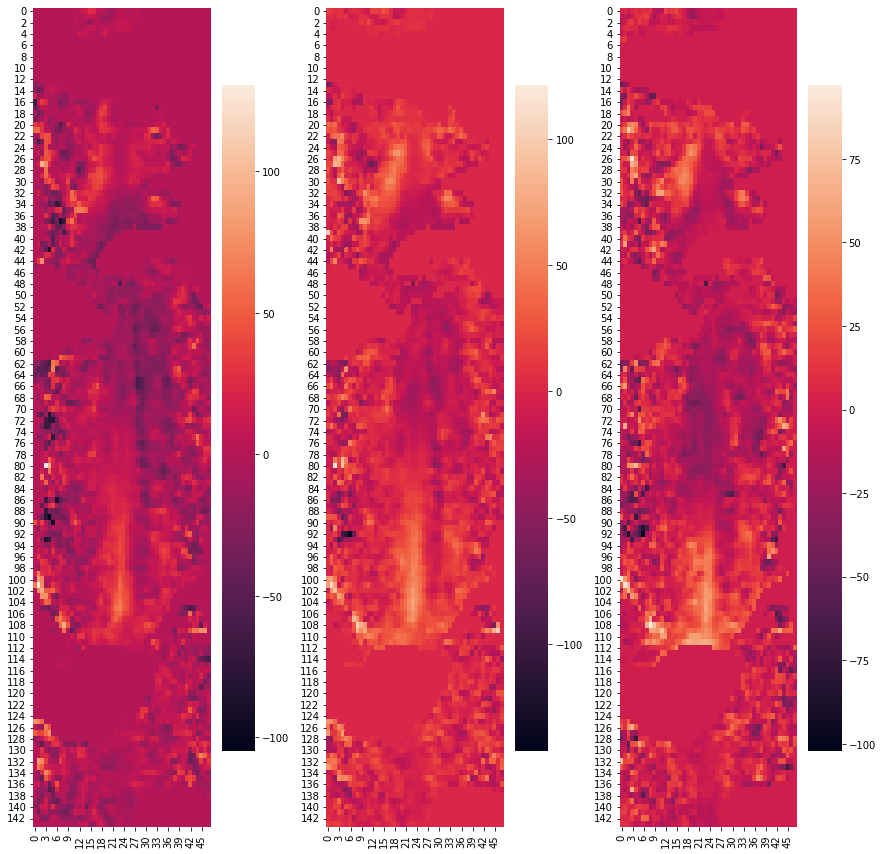

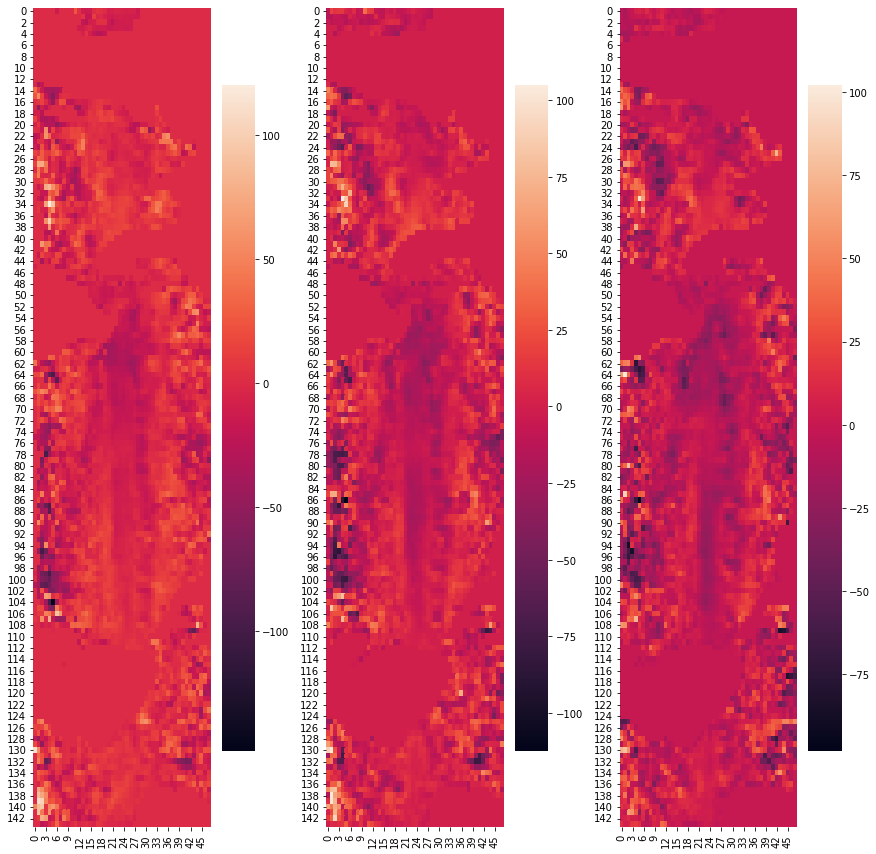

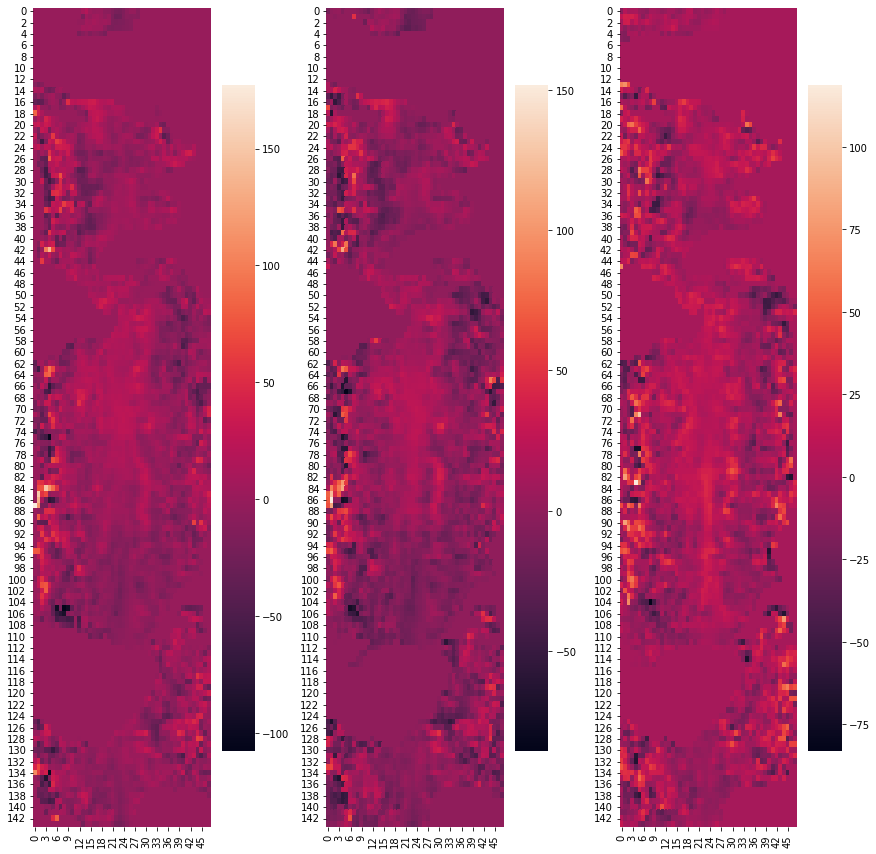

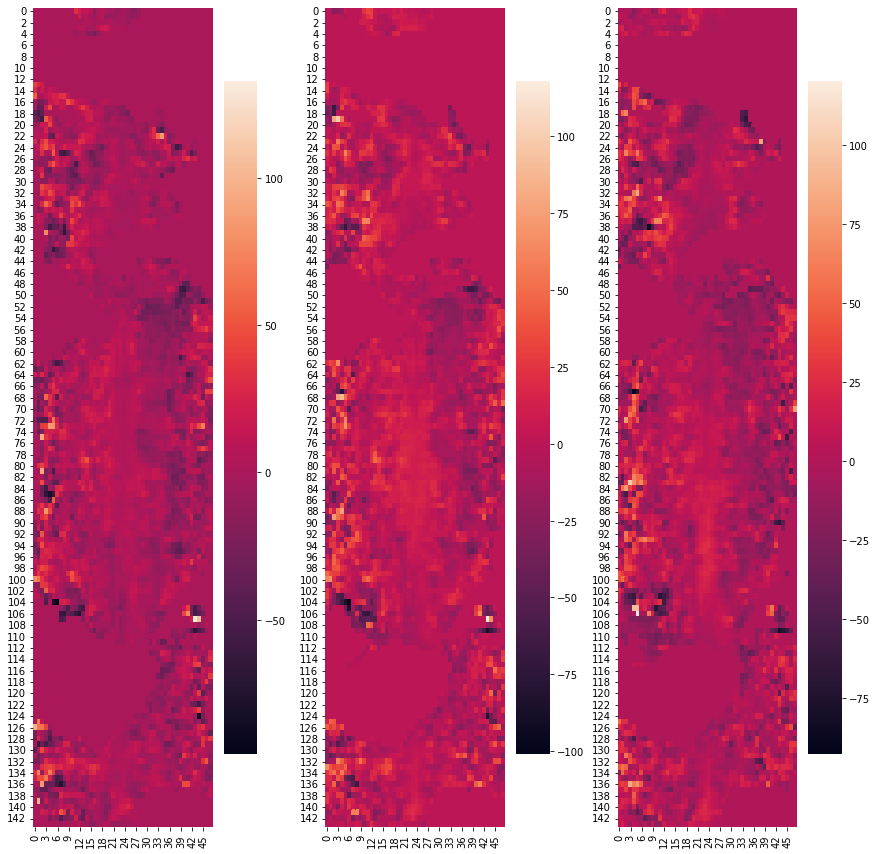

...

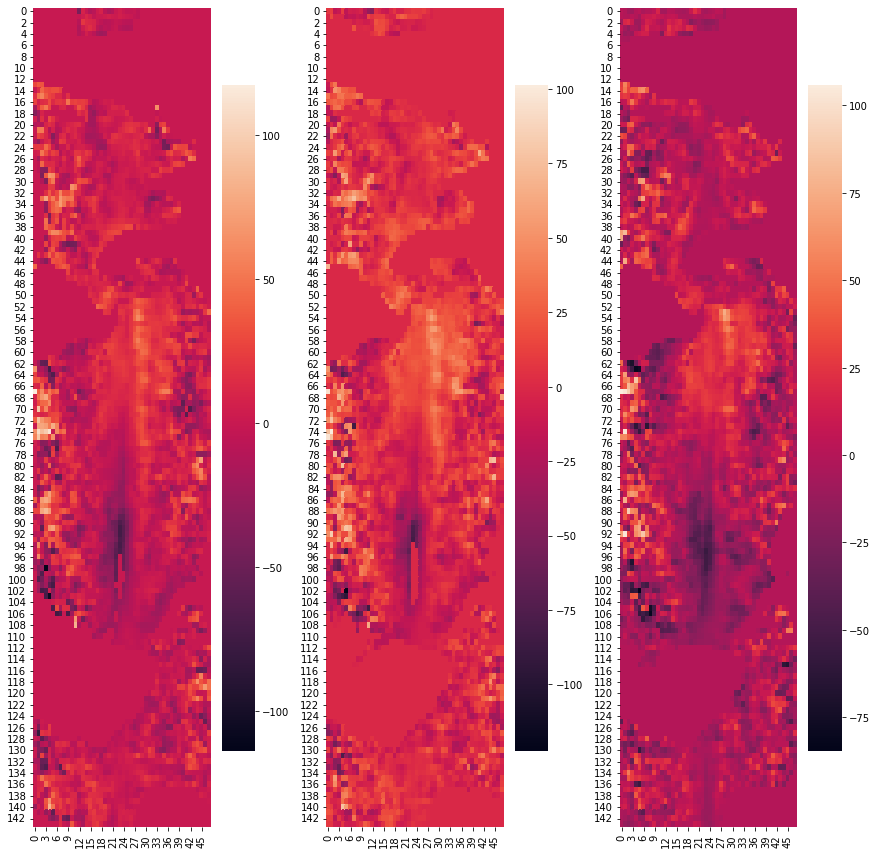

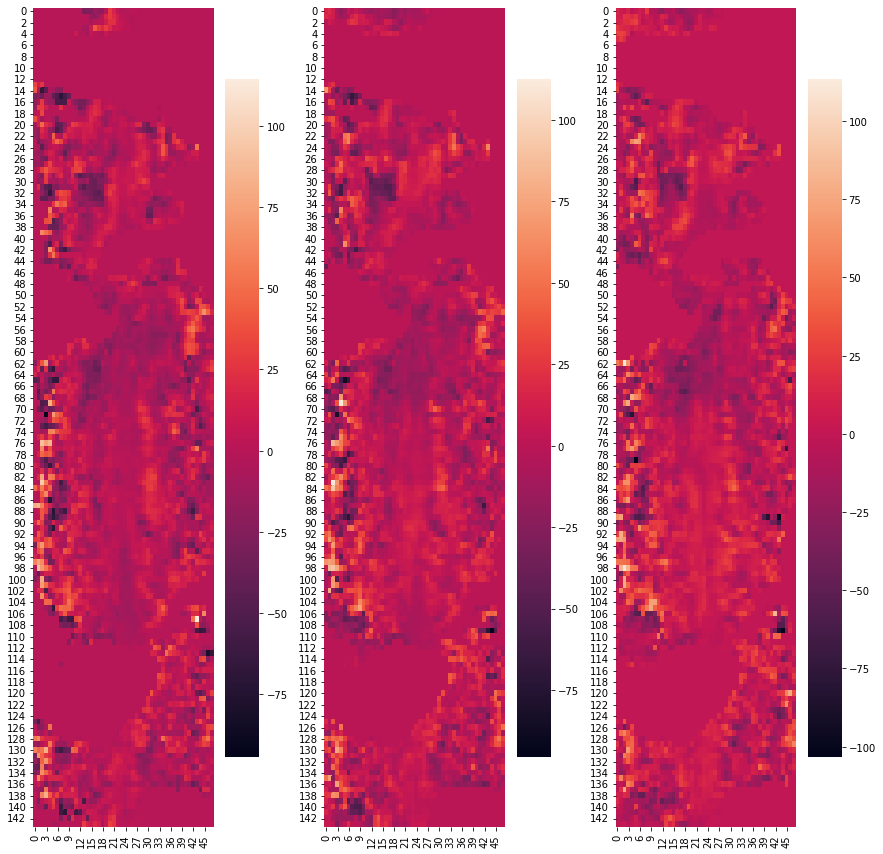

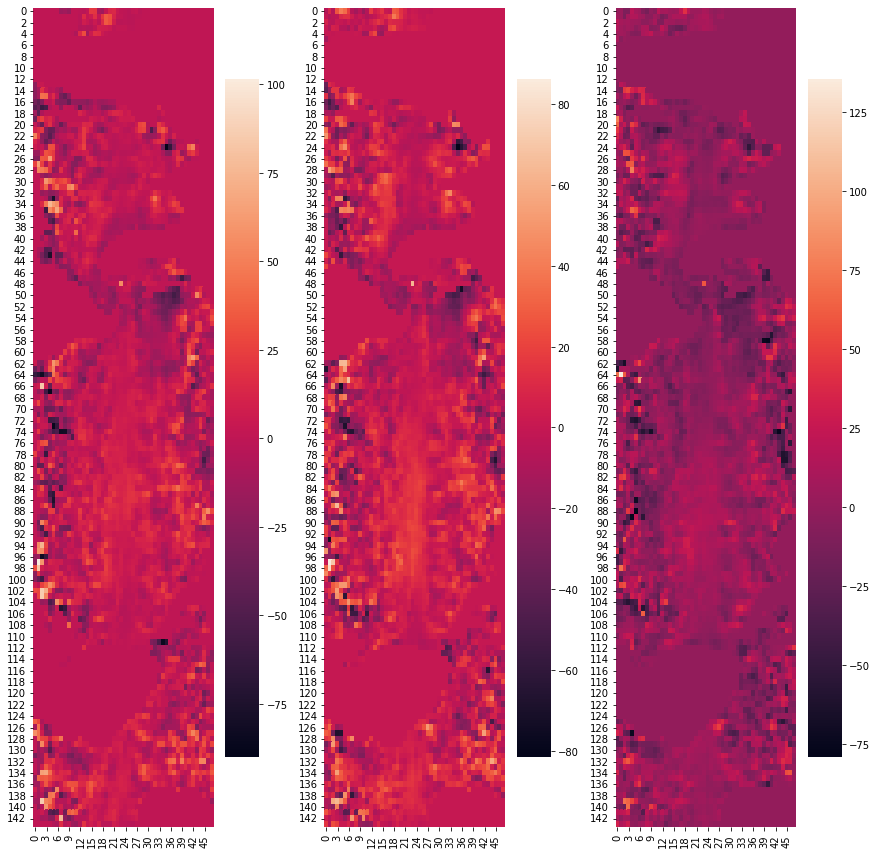

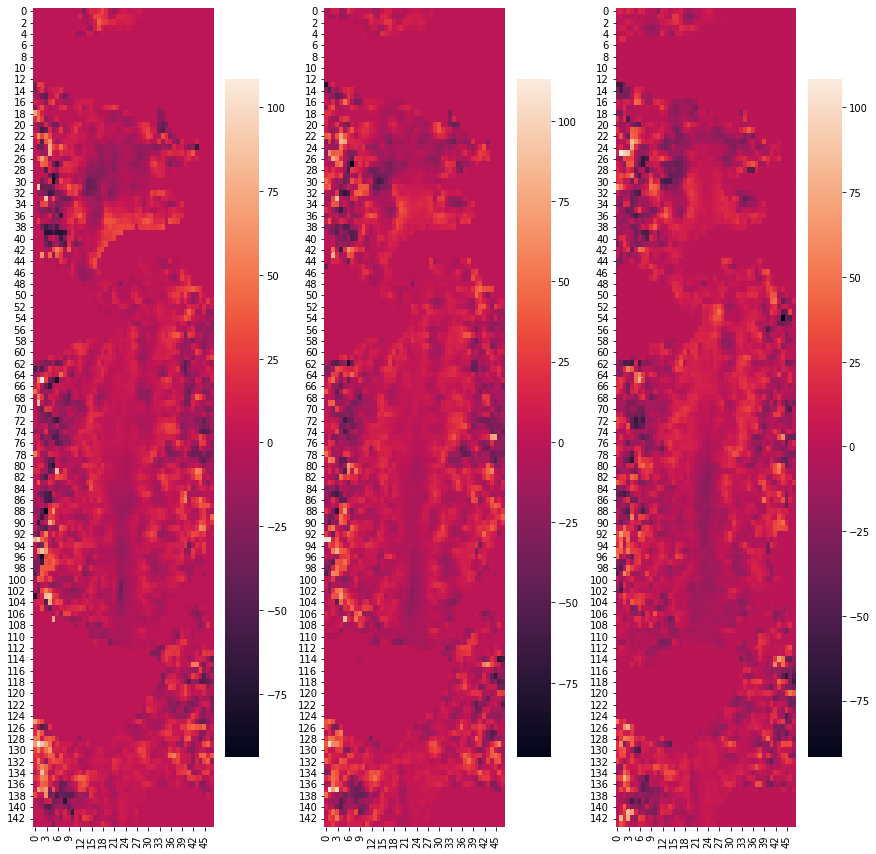

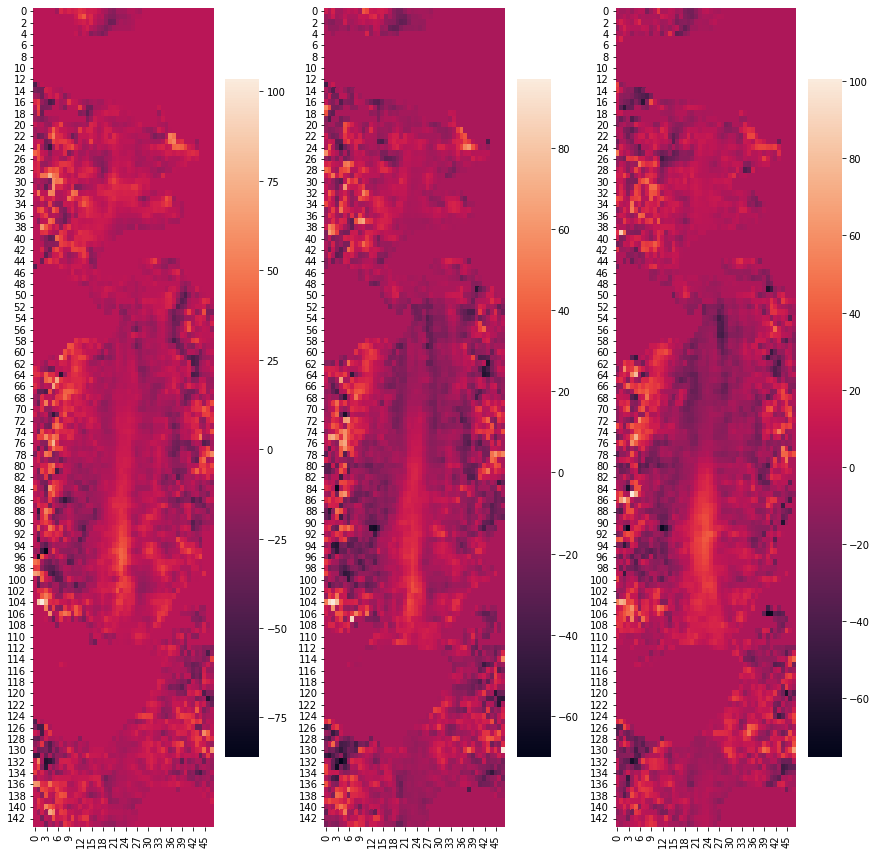

In [ ]:
import seaborn as sns
for lab in range(3):
  for ind in ISMR.loc[ISMR['labels']==lab].index:
    fig,axes=plt.subplots(1,3,figsize = (12,12))
    for pl in range(1,4):

      fig.tight_layout()
      sns.heatmap(ax=axes[pl-1],data=teX[ind,:,:,pl-1])
      #plt.plot()
      #teX[ISMR.loc[ISMR['labels']==0].index][0]

    plt.savefig('Sample_'+str(ind)+'_label_'+str(lab)+'.jpg')
    files.download('Sample_'+str(ind)+'_label_'+str(lab)+'.jpg')
    #plt.show()


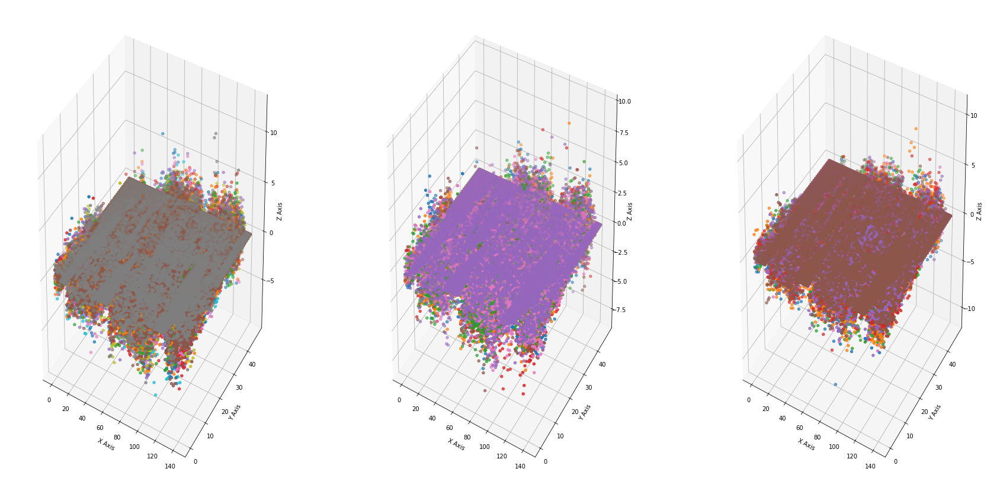

In [ ]:
# importing numpy package
import numpy as np
# importing matplotlib package
import matplotlib.pyplot as plt
%matplotlib inline
# creating an empty canvas
fig = plt.figure(figsize=(30,15))

mean_teX=np.mean(teX)
std_teX=np.std(teX)

for lab in range(3):
  # Creating an empty 3D axes of the plot
  ax = fig.add_subplot(1,3,(lab+1),projection='3d')

  # Labeling the X Axis
  ax.set_xlabel('X Axis')

  # Labeling the Y-Axis
  ax.set_ylabel('Y Axis')

  # Labeling the Z-Axis
  ax.set_zlabel('Z Axis')

  for ind in ISMR.loc[ISMR['labels']==lab].index:
    x = []

    # Creating Y as an array of numbers
    # which are square of the numbers
    # in X
    y=[]
    z=[]
    for  i in range(144):
      for j in range(48):
        x.append(i)
        y.append(j)
        z.append((teX[ind,i,j,2]-mean_teX)/std_teX)

    # Creating a 2D data Scatter plot for the
    # on a 3D axis figure
    ax.scatter(x, y,z)

  # Showing the above 3D plot
plt.show()


#Plot on planes

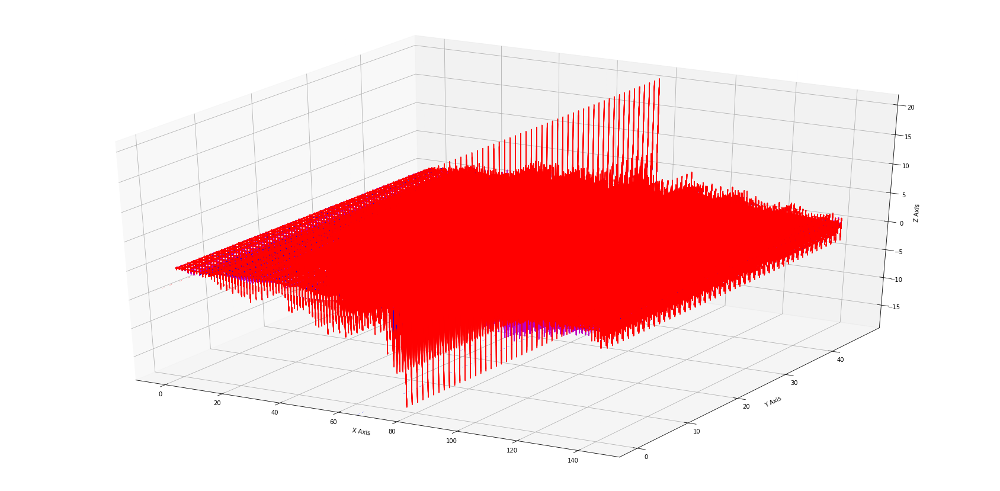

In [ ]:
# importing numpy package
import numpy as np
# importing matplotlib package
import matplotlib.pyplot as plt
%matplotlib inline
# creating an empty canvas

opt_test=np.load('opt_test_10.npy', allow_pickle=True)

fig = plt.figure(figsize=(30,15))

mean_teX=np.mean(teX)
std_teX=np.std(teX)

# Creating an empty 3D axes of the plot
#ax = fig.add_subplot(1,3,(lab+1),projection='3d')
ax = fig.gca(projection='3d')

# Labeling the X Axis
ax.set_xlabel('X Axis')

# Labeling the Y-Axis
ax.set_ylabel('Y Axis')

# Labeling the Z-Axis
ax.set_zlabel('Z Axis')
for (lab,color) in zip(range(3),['b','m','r']):


  for ind in ISMR.loc[ISMR['labels']==lab].index:
    x = []

    # Creating Y as an array of numbers
    # which are square of the numbers
    # in X
    y=[]
    z=[]
    for  i in range(144):
      for j in range(48):
        x.append(i)
        y.append(j)
        z.append(opt_test[ind,i,j,0])


    xx, yy = np.meshgrid(np.array(x), np.array(y))
    zz=np.meshgrid(np.array(z),np.array(z))[0]
    # plot the surface
    ax.plot_wireframe(xx, yy, zz, color=color)

    # Creating a 2D data Scatter plot for the
    # on a 3D axis figure
    #ax.scatter(x, y,z)

  # Showing the above 3D plot
plt.show()


In [ ]:
X.shape

(1024, 256)

In [ ]:
np.array(zz)


array([[ 1.97060133e-01, -3.43916137e-01, -3.22318551e-01, ...,
        -8.03015271e-14, -8.03015271e-14, -8.03015271e-14],
       [ 1.97060133e-01, -3.43916137e-01, -3.22318551e-01, ...,
        -8.03015271e-14, -8.03015271e-14, -8.03015271e-14],
       [ 1.97060133e-01, -3.43916137e-01, -3.22318551e-01, ...,
        -8.03015271e-14, -8.03015271e-14, -8.03015271e-14],
       ...,
       [ 1.97060133e-01, -3.43916137e-01, -3.22318551e-01, ...,
        -8.03015271e-14, -8.03015271e-14, -8.03015271e-14],
       [ 1.97060133e-01, -3.43916137e-01, -3.22318551e-01, ...,
        -8.03015271e-14, -8.03015271e-14, -8.03015271e-14],
       [ 1.97060133e-01, -3.43916137e-01, -3.22318551e-01, ...,
        -8.03015271e-14, -8.03015271e-14, -8.03015271e-14]])

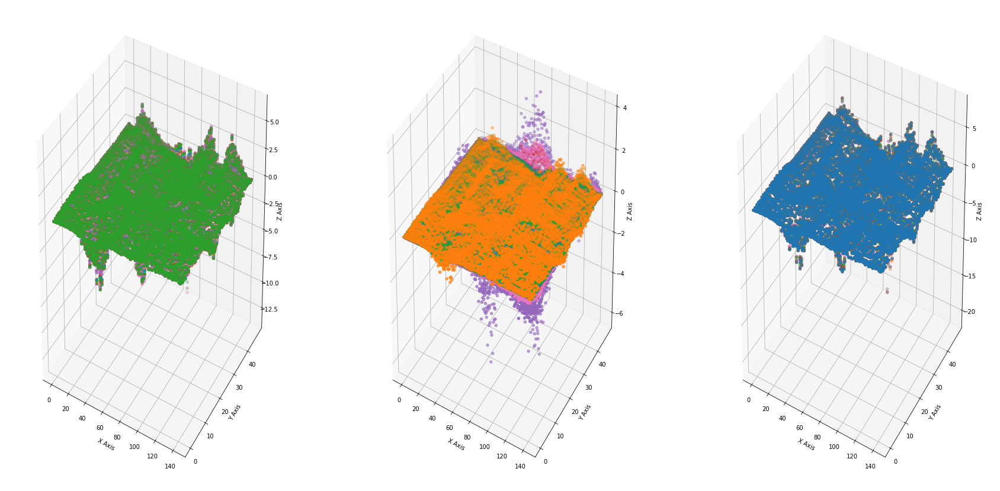

In [ ]:
# importing numpy package
import numpy as np
# importing matplotlib package
import matplotlib.pyplot as plt
%matplotlib inline
# creating an empty canvas
fig = plt.figure(figsize=(30,15))



for lab in range(3):
  # Creating an empty 3D axes of the plot
  ax = fig.add_subplot(1,3,(lab+1),projection='3d')

  # Labeling the X Axis
  ax.set_xlabel('X Axis')

  # Labeling the Y-Axis
  ax.set_ylabel('Y Axis')

  # Labeling the Z-Axis
  ax.set_zlabel('Z Axis')

  for ind in ISMR.loc[ISMR['labels']==lab].index:
    x = []

    # Creating Y as an array of numbers
    # which are square of the numbers
    # in X
    y=[]
    z=[]
    for  i in range(144):
      for j in range(48):
        x.append(i)
        y.append(j)
        z.append(opt_test[ind,i,j,2])

    # Creating a 2D data Scatter plot for the
    # on a 3D axis figure
    ax.scatter(x, y,z)

  # Showing the above 3D plot
plt.show()


In [ ]:
opt_test=np.load('opt_test_10.npy', allow_pickle=True)
plt.hist(opt_test[0,:,:,0])

NameError: ignored

In [ ]:
average_teX=np.zeros(teX[0,:,:,0].shape)
for i in range(len(teX)):
  average_teX=average_teX+teX[i,:,:,0]
average_teX=average_teX/len(teX)

In [ ]:
# for ind in ISMR.loc[ISMR['labels']==0].index:



In [ ]:
!pip install basemap

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 864 kB 5.2 MB/s 
     |████████████████████████████████| 30.5 MB 66.7 MB/s 
     |████████████████████████████████| 46 kB 3.9 MB/s 
     |████████████████████████████████| 6.3 MB 45.7 MB/s 


#Storing latitude longitude information

In [ ]:
import pandas as pd

lat=data1.variables['lat'][:]
lon=data1.variables['lon'][:]
d20=data1.variables['d20'][:]

#Creating Basemap for the projected latitude longitude

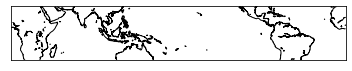

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap

#fig = plt.figure(figsize=(8, 6), edgecolor='w')
m = Basemap(projection='cyl', resolution='l',
            llcrnrlat=np.min(lat), urcrnrlat=np.max(lat),
            llcrnrlon=np.min(lon), urcrnrlon=np.max(lon), )
m.drawcoastlines()
plt.show()

#Flipping given map array upside down for plotting

In [ ]:
teX_flip=[]
for i in range(0,31):

  input_file=np.zeros((48,144,3), dtype=np.float32)
  input_file[:,:,0]=np.flipud(np.transpose(teX[i,:,:,0]))
  input_file[:,:,1]=np.flipud(np.transpose(teX[i,:,:,1]))
  input_file[:,:,2]=np.flipud(np.transpose(teX[i,:,:,2]))

  teX_flip.append(input_file)

teX_flip=np.array(teX_flip)
#teX_flip=np.swapaxes(teX_flip,1,3)

teX_flip=ma.masked_values(teX_flip, 0)
teX_flip.shape

(31, 48, 144, 3)

#EOFS

In [ ]:
!pip install eofs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 5.1 MB/s 
  Created wheel for eofs: filename=eofs-1.4.0-py3-none-any.whl size=1100374 sha256=b2f993bd1e31d71fb7b1b57868f3303fc403c65b5cee4d83d3725173d0e8db9a
  Stored in directory: /root/.cache/pip/wheels/ce/4e/36/2ef48d7342cd326d5f3bdb4ddd0441f06b387b5cbfc8336095
Successfully built eofs


#Eofs for Given Data

In [ ]:
from eofs.standard import Eof
wgts   = np.cos(np.deg2rad(lat))
wgts   = wgts.reshape(len(wgts), 1)
solver = Eof(teX_flip[:,:,:,2], weights=wgts)

In [ ]:
eof1 = solver.eofs(neofs=10)
pc1  = solver.pcs(npcs=10, pcscaling=0)
varfrac = solver.varianceFraction()
lambdas = solver.eigenvalues()

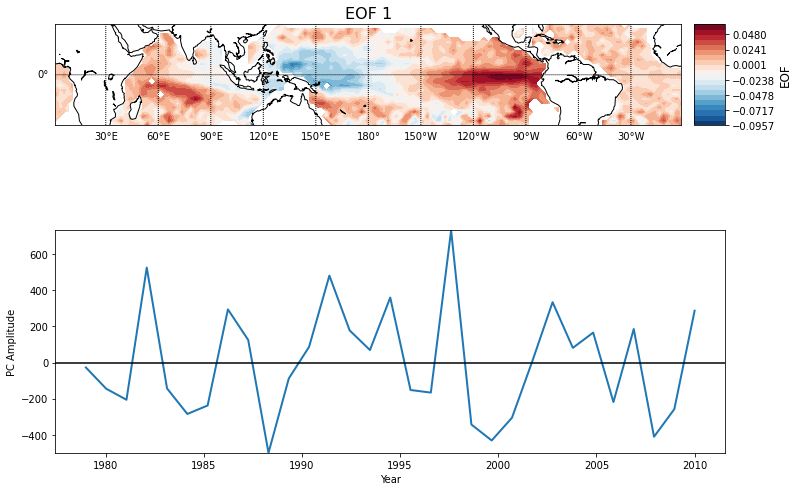

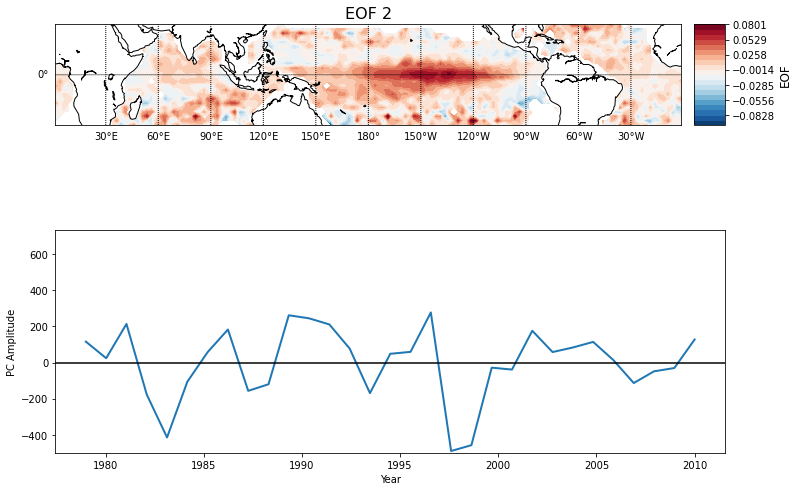

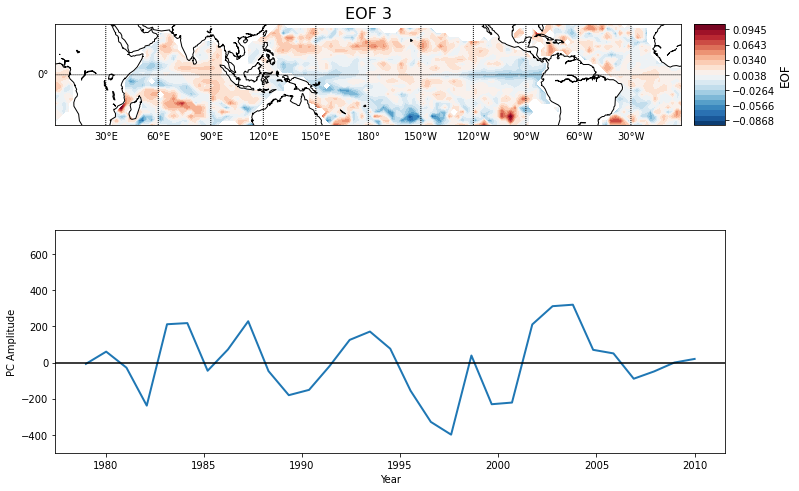

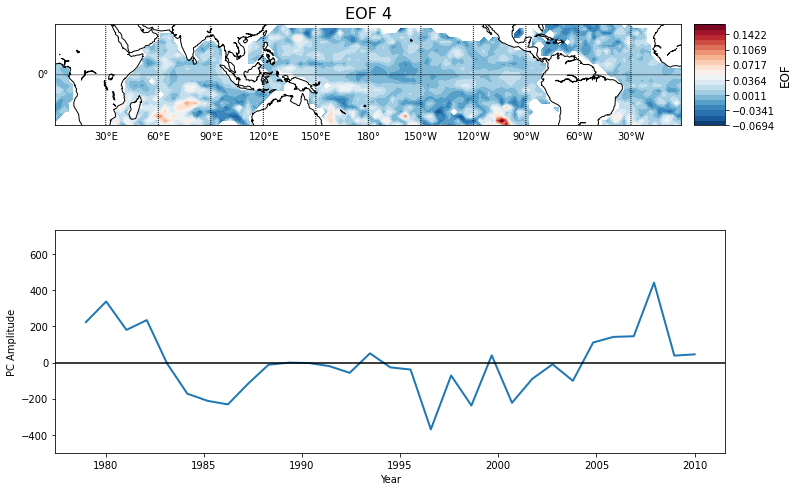

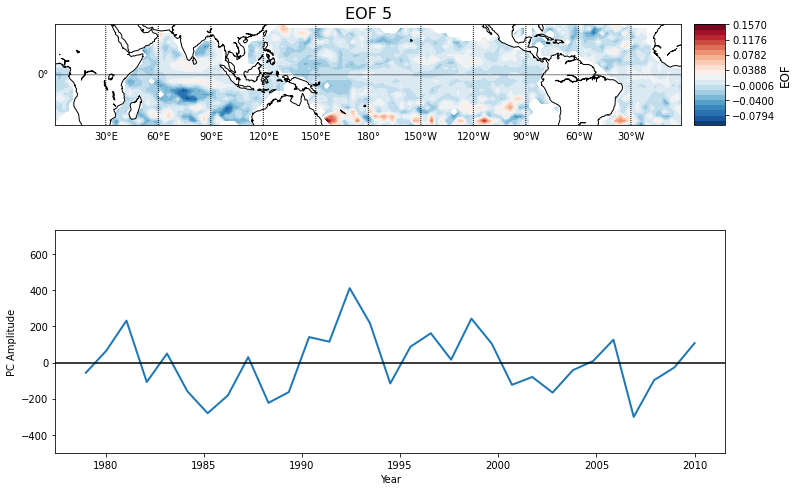

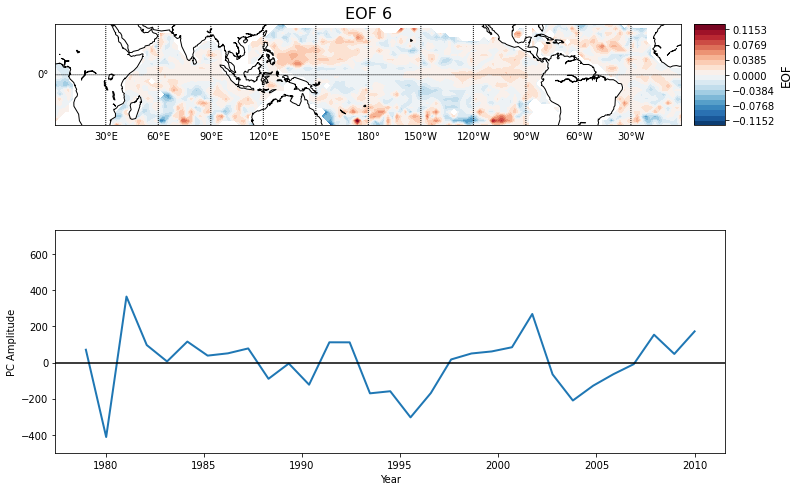

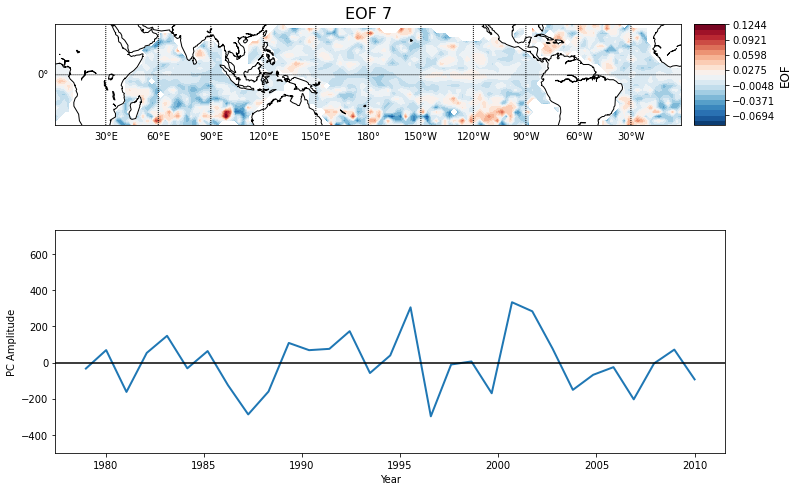

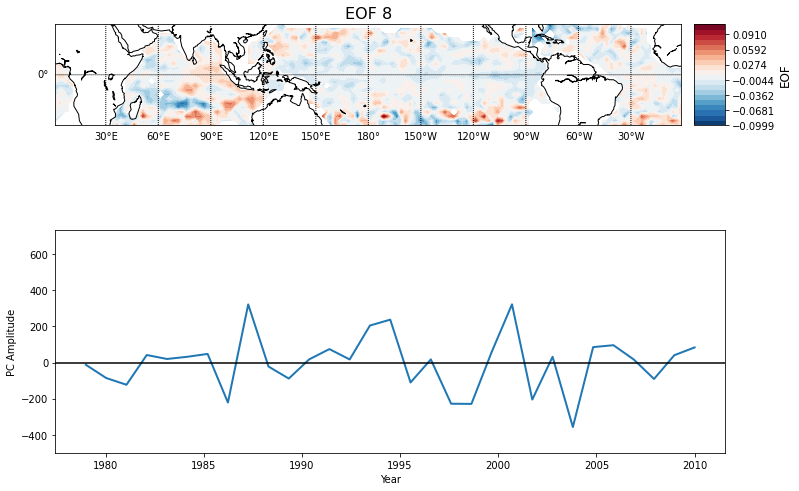

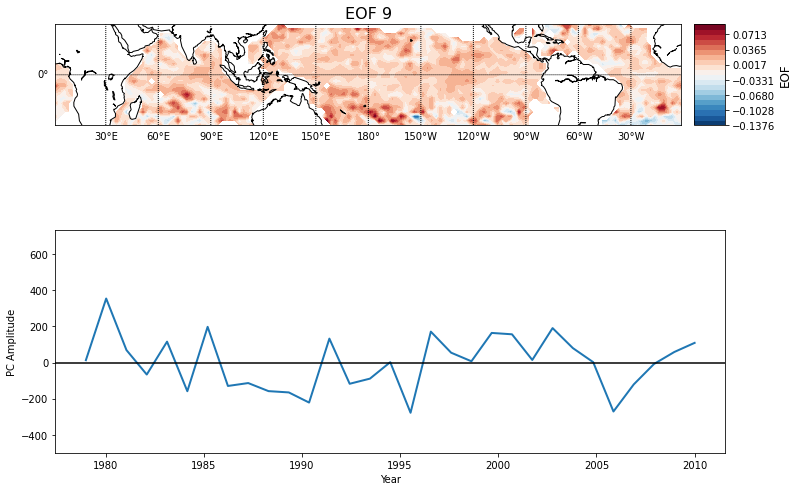

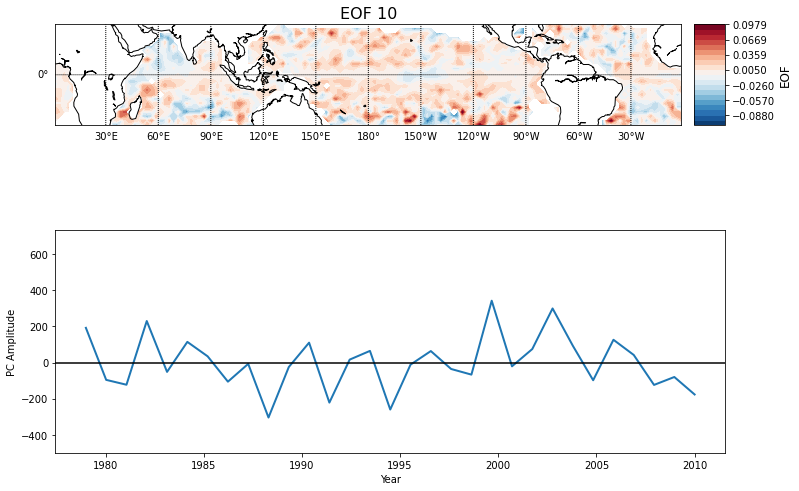

In [ ]:
parallels = np.arange(-90,90,30.)
meridians = np.arange(-180,180,30)

for i in range(0,10):
    fig = plt.figure(figsize=(12,9))
    plt.subplot(211)

    m = Basemap(projection='cyl', llcrnrlon=min(lon), llcrnrlat=min(lat), urcrnrlon=max(lon), urcrnrlat=max(lat))
    x, y = m(*np.meshgrid(lon, lat))
    clevs = np.linspace(np.min(eof1[i,:,:].squeeze()), np.max(eof1[i,:,:].squeeze()), 21)
    cs = m.contourf(x, y, eof1[i,:,:].squeeze(), clevs, cmap=plt.cm.RdBu_r)
    m.drawcoastlines()
    m.drawparallels(parallels, labels=[1,0,0,0])
    m.drawmeridians(meridians, labels=[1,0,0,1])

    cb = m.colorbar(cs, 'right', size='5%', pad='2%')
    cb.set_label('EOF', fontsize=12)
    plt.title('EOF ' + str(i+1), fontsize=16)

    plt.subplot(212)
    days = np.linspace(1979,2010,teX_flip[:,:,:,0].shape[0])
    plt.plot(days, pc1[:,i], linewidth=2)
    plt.axhline(0, color='k')
    plt.xlabel('Year')
    plt.ylabel('PC Amplitude')
    plt.ylim(np.min(pc1.squeeze()), np.max(pc1.squeeze()))

#Eofs for Label wise Given Data

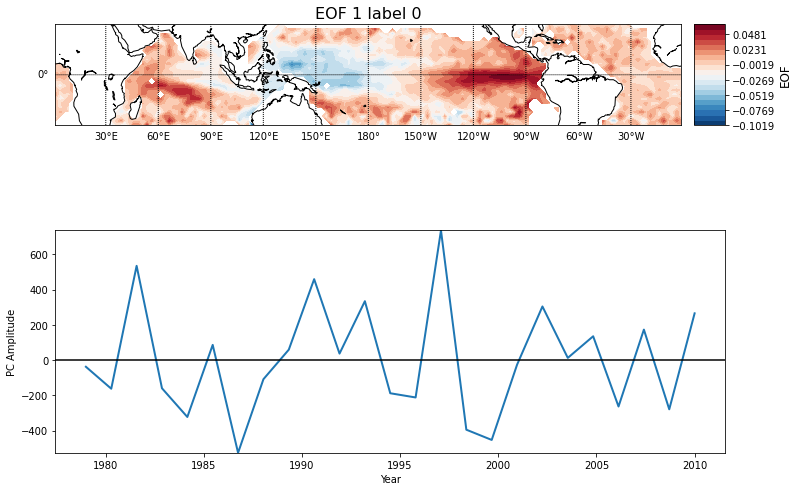

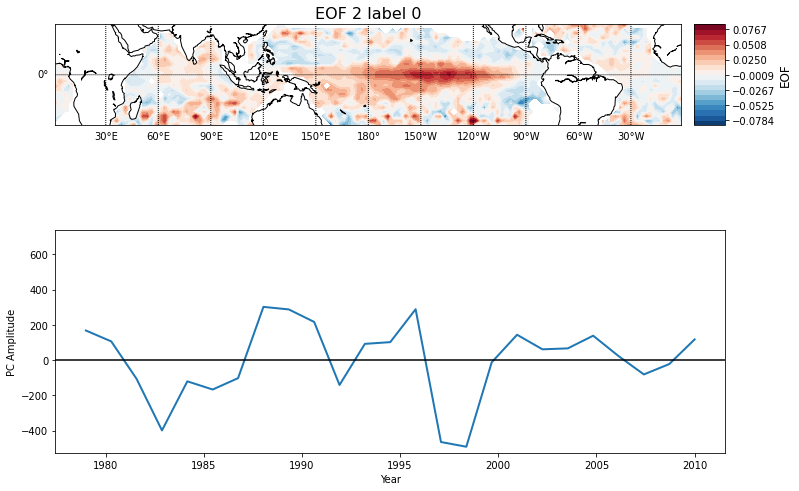

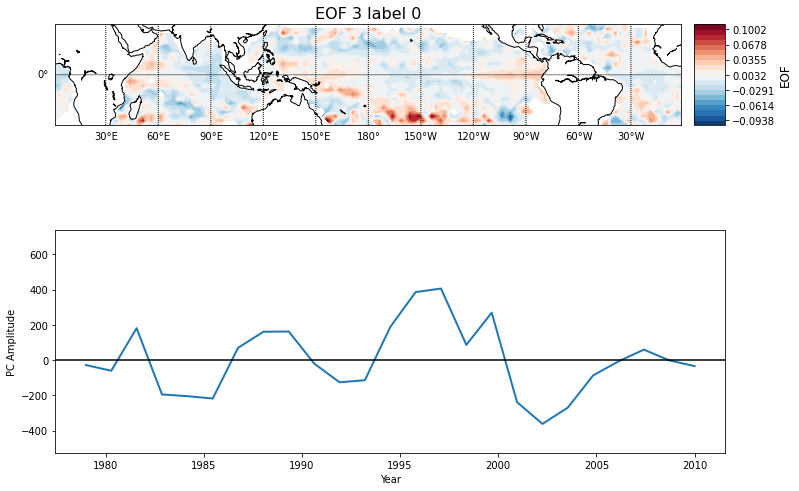

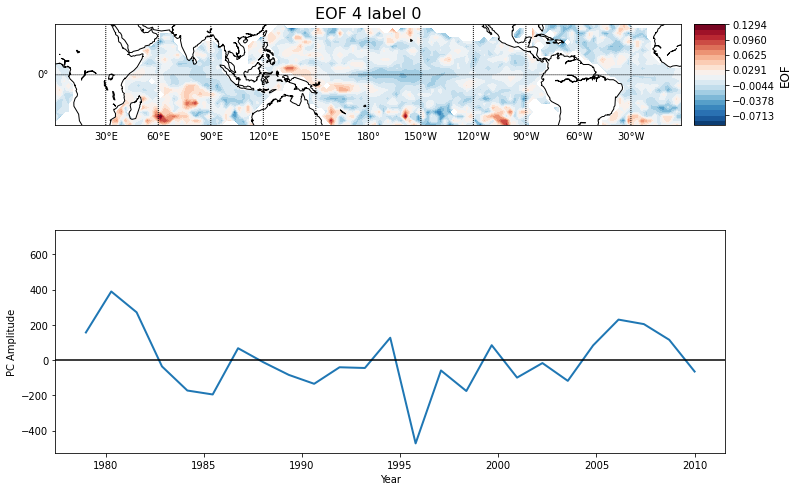

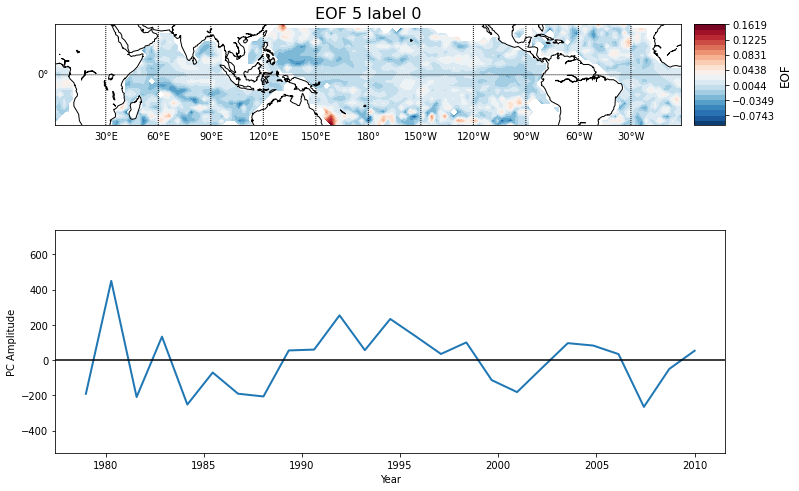

...

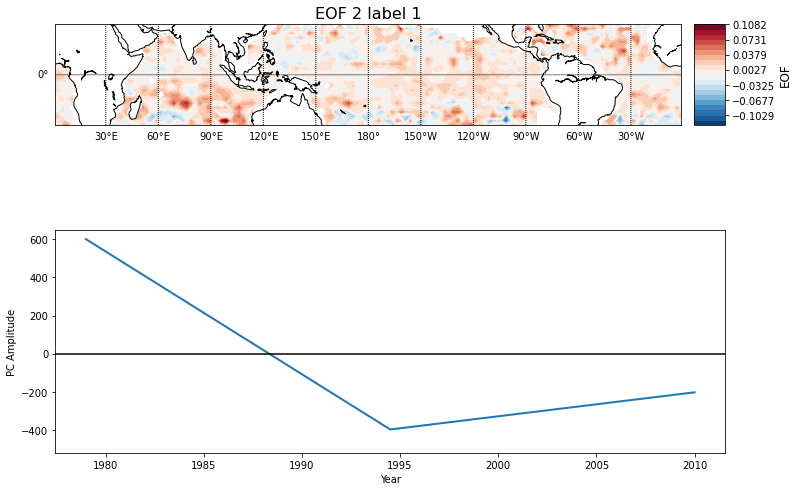

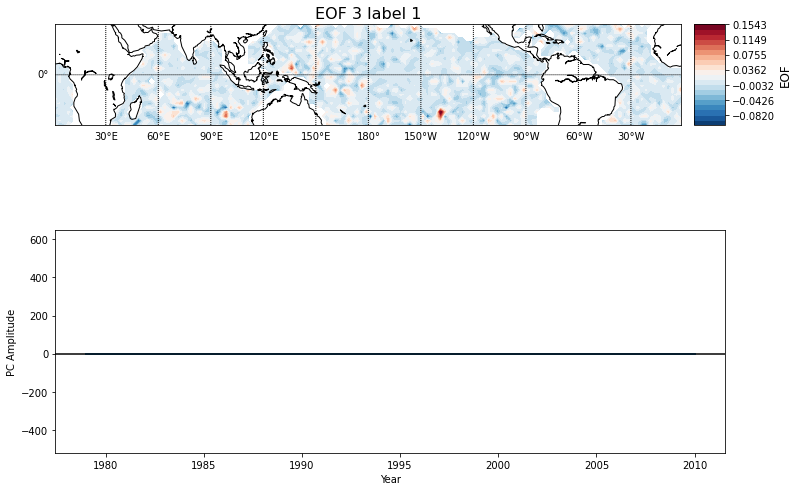

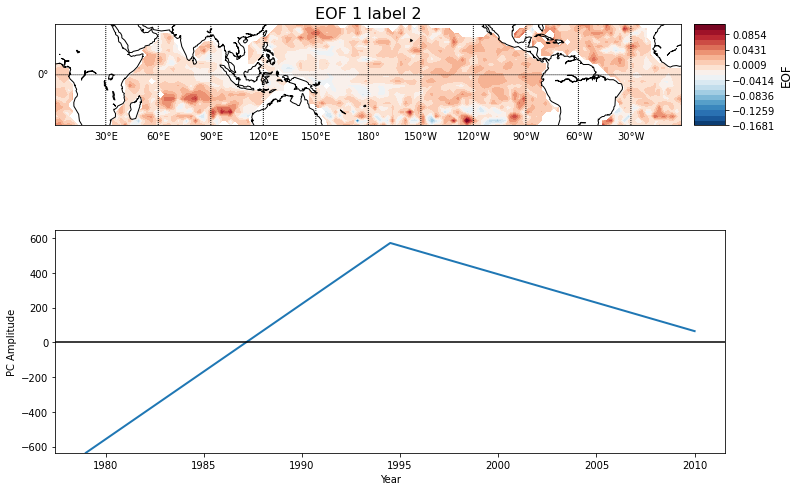

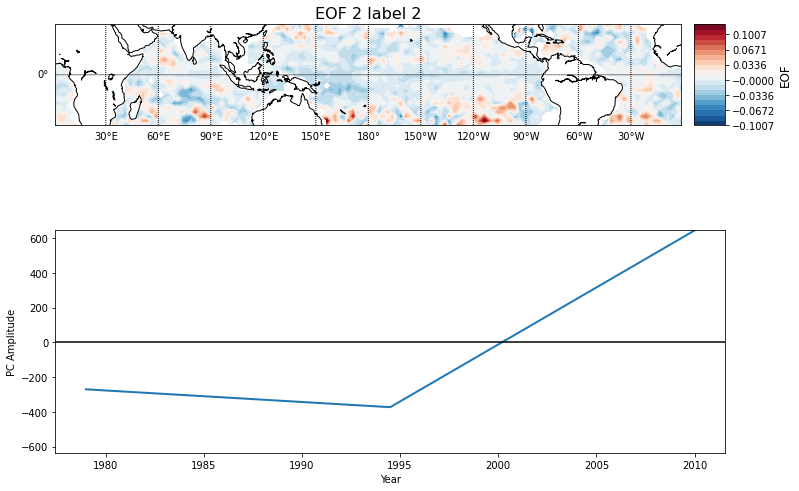

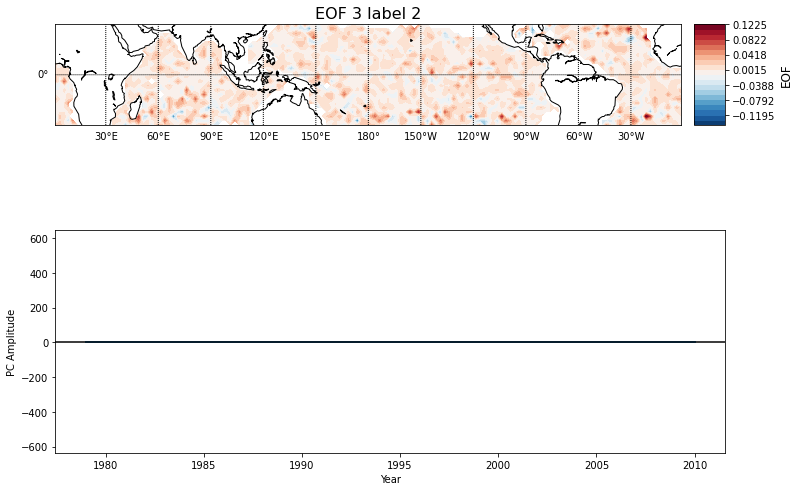

In [ ]:
from eofs.standard import Eof

for lab in range(3):




  wgts   = np.cos(np.deg2rad(lat))
  wgts   = wgts.reshape(len(wgts), 1)
  solver = Eof(teX_flip[ISMR.loc[ISMR['labels']==lab].index,:,:,2], weights=wgts)

  eof1 = solver.eofs(neofs=10)
  pc1  = solver.pcs(npcs=10, pcscaling=0)
  varfrac = solver.varianceFraction()
  lambdas = solver.eigenvalues()


  parallels = np.arange(-90,90,30.)
  meridians = np.arange(-180,180,30)

  for i in range(0,len(eof1)):
      fig = plt.figure(figsize=(12,9))
      plt.subplot(211)

      m = Basemap(projection='cyl', llcrnrlon=min(lon), llcrnrlat=min(lat), urcrnrlon=max(lon), urcrnrlat=max(lat))
      x, y = m(*np.meshgrid(lon, lat))
      clevs = np.linspace(np.min(eof1[i,:,:].squeeze()), np.max(eof1[i,:,:].squeeze()), 21)
      cs = m.contourf(x, y, eof1[i,:,:].squeeze(), clevs, cmap=plt.cm.RdBu_r)
      m.drawcoastlines()
      m.drawparallels(parallels, labels=[1,0,0,0])
      m.drawmeridians(meridians, labels=[1,0,0,1])

      cb = m.colorbar(cs, 'right', size='5%', pad='2%')
      cb.set_label('EOF', fontsize=12)
      plt.title('EOF '+ str(i+1) + ' label ' +str(lab) , fontsize=16)

      plt.subplot(212)
      days = np.linspace(1979,2010,teX_flip[ISMR.loc[ISMR['labels']==lab].index,:,:,2].shape[0])
      plt.plot(days, pc1[:,i], linewidth=2)
      plt.axhline(0, color='k')
      plt.xlabel('Year')
      plt.ylabel('PC Amplitude')
      plt.ylim(np.min(pc1.squeeze()), np.max(pc1.squeeze()))

In [ ]:
ISMR.loc[ISMR['labels']==lab]

,ismr_data,year,labels
6,-1.081522,1987,1
21,-1.547177,2002,1
28,-1.119619,2009,1


#Plotting normalised given D20 map on the basemap

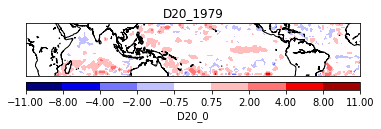

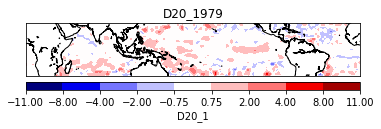

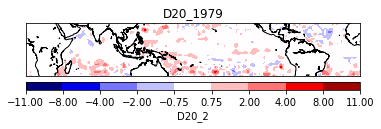

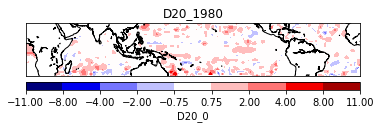

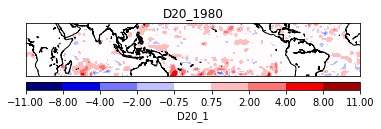

...

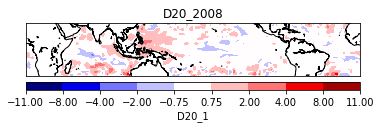

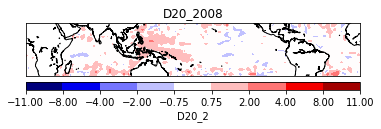

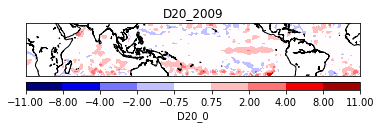

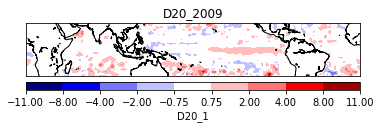

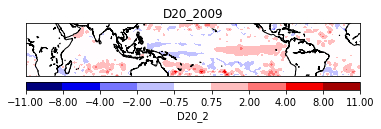

In [ ]:
mean_teX=teX_flip.mean()
std_teX=teX_flip.std()
for i in range(len(teX_flip)):
  for j in range(3):
    %matplotlib inline
    lons,lats= np.meshgrid(lon,lat) # for this dataset, longitude is 0 through 360, so you need to subtract 180 to properly display on map
    x,y = m(lons,lats)


    m.drawcoastlines()
    #levels = np.linspace(min(np.unique((teX_flip-mean_teX)/std_teX)),max(np.unique((teX_flip-mean_teX)/std_teX)),10)
    levels=[-11,-8,-4,-2,-.75,+.75,+2,+4,+8,+11]
    temp = m.contourf(x,y,(teX_flip[i,:,:,j]-mean_teX)/std_teX,levels=levels,cmap='seismic')
    cb = m.colorbar(temp,"bottom", size="15%", pad="10%")
    #m.drawcoastlines()
    plt.title('D20_'+str(i+1979))
    cb.set_label('D20_'+str(j))

    plt.savefig('result_given_2.5/D20_'+str(i+1979)+'_'+str(j)+'.jpg')
    #files.download('D20_'+str(i+1979)+'_'+str(j)+'.jpg')
    plt.show()

In [ ]:
!zip -r result_given_2.5.zip result_given_2.5/

  adding: result_given_2.5/ (stored 0%)
  adding: result_given_2.5/D20_2004_0.jpg (deflated 8%)
  adding: result_given_2.5/D20_1979_2.jpg (deflated 8%)
  adding: result_given_2.5/D20_2000_1.jpg (deflated 8%)
  adding: result_given_2.5/D20_1979_1.jpg (deflated 8%)
  adding: result_given_2.5/D20_1999_2.jpg (deflated 8%)
  adding: result_given_2.5/D20_2002_0.jpg (deflated 8%)
  adding: result_given_2.5/D20_1989_1.jpg (deflated 8%)
  adding: result_given_2.5/D20_1988_1.jpg (deflated 8%)
  adding: result_given_2.5/D20_1985_1.jpg (deflated 8%)
  adding: result_given_2.5/D20_1996_0.jpg (deflated 8%)
  adding: result_given_2.5/D20_1989_2.jpg (deflated 8%)
  adding: result_given_2.5/D20_1994_2.jpg (deflated 8%)
  adding: result_given_2.5/D20_1998_2.jpg (deflated 8%)
  adding: result_given_2.5/D20_1985_0.jpg (deflated 8%)
  adding: result_given_2.5/D20_1983_2.jpg (deflated 8%)
  adding: result_given_2.5/D20_2008_2.jpg (deflated 8%)
  adding: result_given_2.5/D20_1986_0.jpg (deflated 8%)
  adding

#Loading optimised input and flipping it upside down

In [ ]:
opt_test=np.load('opt_test_10.npy', allow_pickle=True)

mask=teX_flip.mask
teX_flip=[]
for i in range(0,31):

  input_file=np.zeros((48,144,3), dtype=np.float32)
  input_file[:,:,0]=np.flipud(np.transpose(opt_test[i,:,:,0]))
  input_file[:,:,1]=np.flipud(np.transpose(opt_test[i,:,:,1]))
  input_file[:,:,2]=np.flipud(np.transpose(opt_test[i,:,:,2]))

  teX_flip.append(input_file)

teX_flip=np.array(teX_flip)
#teX_flip=np.swapaxes(teX_flip,1,3)

teX_flip=ma.masked_array(teX_flip, mask=mask)
teX_flip.shape

(31, 48, 144, 3)

#Plotting normalised optimised D20 map on Basemap

In [ ]:
mean_opt=teX_flip.mean()
std_opt=teX_flip.std()

for i in range(len(opt_test)):
  for j in range(3):
    %matplotlib inline
    lons,lats= np.meshgrid(lon,lat) # for this dataset, longitude is 0 through 360, so you need to subtract 180 to properly display on map
    x,y = m(lons,lats)


    m.drawcoastlines()
    #levels = np.linspace(min(np.unique((teX_flip-mean_opt)/std_opt)),max(np.unique((teX_flip-mean_opt)/std_opt)),21)
    levels=[-21,-12,-8,-2,-.5,+.5,+2,+8,+12,+21]
    temp = m.contourf(x,y,(teX_flip[i,:,:,j]-mean_opt)/std_opt,levels=levels,cmap='seismic')
    cb = m.colorbar(temp,"bottom", size="15%", pad="10%")
    #m.drawcoastlines()
    plt.title('D20_'+str(i+1979))
    cb.set_label('D20_'+str(j))

    plt.savefig('result_optimised/D20_'+str(i+1979)+'_'+str(j)+'.jpg')

    #files.download('Sample_optimum'+str(i)+'_'+str(j)+'.jpg')
    plt.show()

NameError: ignored

In [ ]:
!zip -r result_optimised.zip result_optimised/

  adding: result_optimised/ (stored 0%)
  adding: result_optimised/D20_1986_0.jpg (deflated 7%)
  adding: result_optimised/D20_1995_0.jpg (deflated 8%)
  adding: result_optimised/D20_1985_1.jpg (deflated 11%)
  adding: result_optimised/D20_2004_2.jpg (deflated 7%)
  adding: result_optimised/D20_1989_2.jpg (deflated 7%)
  adding: result_optimised/D20_1980_2.jpg (deflated 11%)
  adding: result_optimised/D20_2002_2.jpg (deflated 12%)
  adding: result_optimised/D20_2007_0.jpg (deflated 11%)
  adding: result_optimised/D20_1996_0.jpg (deflated 8%)
  adding: result_optimised/D20_1994_0.jpg (deflated 8%)
  adding: result_optimised/D20_1985_0.jpg (deflated 11%)
  adding: result_optimised/D20_2005_2.jpg (deflated 6%)
  adding: result_optimised/D20_1988_2.jpg (deflated 7%)
  adding: result_optimised/D20_2001_2.jpg (deflated 7%)
  adding: result_optimised/D20_1998_0.jpg (deflated 9%)
  adding: result_optimised/D20_2009_0.jpg (deflated 8%)
  adding: result_optimised/D20_1985_2.jpg (deflated 10%)
  

#flipping  upside down label-wise for Given Data

In [ ]:
lab=0
teX_flip=[]
for i in ISMR.loc[ISMR['labels']==lab].index:

  input_file=np.zeros((24,144,3), dtype=np.float32)
  input_file[:,:,0]=np.flipud(np.transpose(teX[i,:,:,0]))
  input_file[:,:,1]=np.flipud(np.transpose(teX[i,:,:,1]))
  input_file[:,:,2]=np.flipud(np.transpose(teX[i,:,:,2]))

  teX_flip.append(input_file)

teX_flip=np.array(teX_flip)
#teX_flip=np.swapaxes(teX_flip,1,3)

teX_flip=ma.masked_values(teX_flip, 0)
teX_flip.shape

(25, 24, 144, 3)

#Plotting label-wise normalised given data

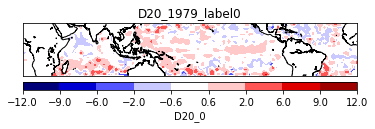

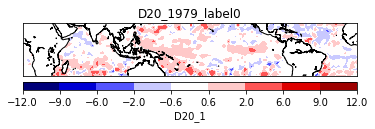

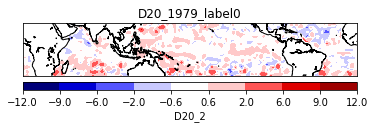

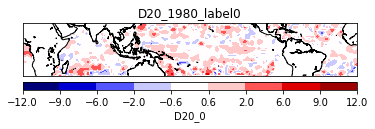

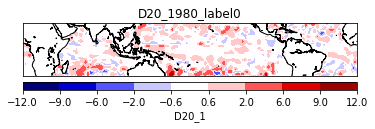

...

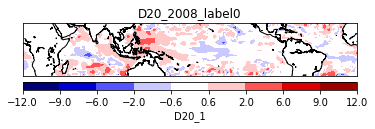

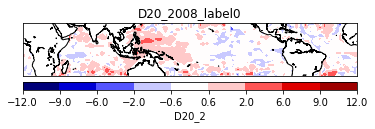

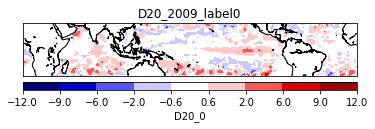

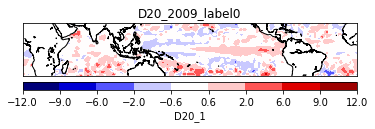

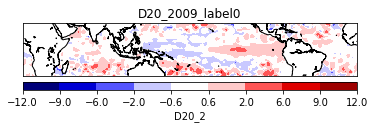

In [ ]:
mean_teX=teX.mean()
std_teX=teX.std()

for i in range(len(teX_flip)):
  for j in range(3):
    %matplotlib inline
    lons,lats= np.meshgrid(lon,lat) # for this dataset, longitude is 0 through 360, so you need to subtract 180 to properly display on map
    x,y = m(lons,lats)


    m.drawcoastlines()
    #levels = np.linspace(min(np.unique((teX_flip-mean_teX)/std_teX)),max(np.unique((teX_flip-mean_teX)/std_teX)),5)
    levels=[-12,-9,-6,-2,-.6,+.6,+2,+6,+9,+12]
    temp = m.contourf(x,y,(teX_flip[i,:,:,j]-mean_teX)/std_teX,levels=levels,cmap='seismic')
    cb = m.colorbar(temp,"bottom", size="15%", pad="10%")
    #m.drawcoastlines()
    plt.title('D20_'+str(ISMR.loc[ISMR['labels']==lab].index[i]+1979)+'_label'+str(lab))
    cb.set_label('D20_'+str(j))

    plt.savefig('label_norm_given_2.5/D20_'+str(ISMR.loc[ISMR['labels']==lab].index[i]+1979)+'_'+str(j)+'_label_'+str(lab)+'.jpg')
    #files.download('D20_'+str(i+1979)+'_'+str(j)+'.jpg')
    plt.show()

    #files.download('Sample_optimum'+str(i)+'_'+str(j)+'.jpg')

In [ ]:
!zip -r label_norm_given_2.5.zip label_norm_given_2.5/

  adding: label_norm_given_2.5/ (stored 0%)
  adding: label_norm_given_2.5/D20_1987_1_label_0.jpg (deflated 7%)
  adding: label_norm_given_2.5/D20_1986_1_label_2.jpg (deflated 7%)
  adding: label_norm_given_2.5/D20_2000_1_label_1.jpg (deflated 8%)
  adding: label_norm_given_2.5/D20_1990_1_label_0.jpg (deflated 8%)
  adding: label_norm_given_2.5/D20_1983_2_label_0.jpg (deflated 7%)
  adding: label_norm_given_2.5/D20_1979_1_label_0.jpg (deflated 8%)
  adding: label_norm_given_2.5/D20_2005_2_label_0.jpg (deflated 7%)
  adding: label_norm_given_2.5/D20_1979_0_label_0.jpg (deflated 7%)
  adding: label_norm_given_2.5/D20_1982_0_label_0.jpg (deflated 7%)
  adding: label_norm_given_2.5/D20_1991_1_label_0.jpg (deflated 7%)
  adding: label_norm_given_2.5/D20_2008_0_label_0.jpg (deflated 8%)
  adding: label_norm_given_2.5/D20_1994_2_label_0.jpg (deflated 8%)
  adding: label_norm_given_2.5/D20_1996_0_label_0.jpg (deflated 7%)
  adding: label_norm_given_2.5/D20_1993_0_label_0.jpg (deflated 8%)
  ad

#flipping  upside down label-wise for Optimised Data

In [ ]:
opt_test=np.load('opt_test_10.npy', allow_pickle=True)
lab=0
teX_flip=[]
for i in ISMR.loc[ISMR['labels']==lab].index:

  input_file=np.zeros((48,144,3), dtype=np.float32)
  input_file[:,:,0]=np.flipud(np.transpose(opt_test[i,:,:,0]))
  input_file[:,:,1]=np.flipud(np.transpose(opt_test[i,:,:,1]))
  input_file[:,:,2]=np.flipud(np.transpose(opt_test[i,:,:,2]))

  teX_flip.append(input_file)

teX_flip=np.array(teX_flip)
#teX_flip=np.swapaxes(teX_flip,1,3)

teX_flip=ma.masked_values(teX_flip, 0)
teX_flip.shape

(17, 48, 144, 3)

#Plotting label-wise normalised Optimised data

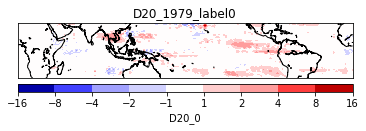

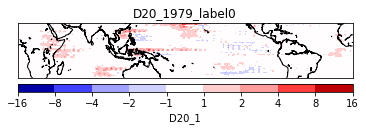

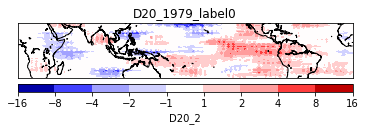

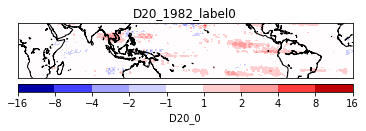

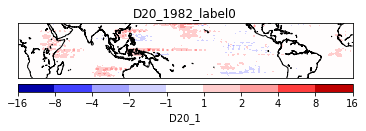

...

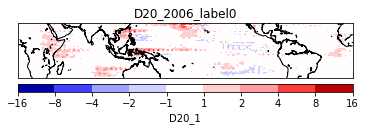

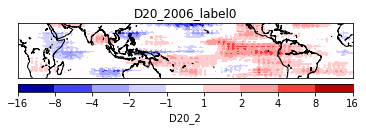

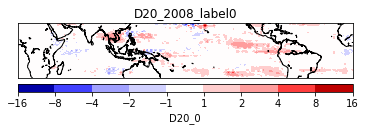

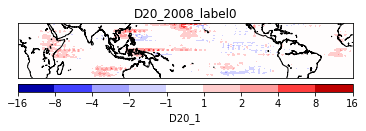

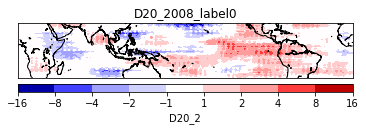

In [ ]:
mean_opt=opt_test.mean()
std_opt=opt_test.std()

for i in range(len(teX_flip)):
  for j in range(3):
    %matplotlib inline
    lons,lats= np.meshgrid(lon,lat) # for this dataset, longitude is 0 through 360, so you need to subtract 180 to properly display on map
    x,y = m(lons,lats)


    m.drawcoastlines()
    #levels = np.linspace(min(np.unique((teX_flip-mean_opt)/std_opt)),max(np.unique((teX_flip-mean_opt)/std_opt)),5)
    levels=[-16,-8,-4,-2,-1,+1,+2,+4,+8,+16]
    temp = m.contourf(x,y,(teX_flip[i,:,:,j]-mean_opt)/std_opt,levels=levels,cmap='seismic')
    cb = m.colorbar(temp,"bottom", size="15%", pad="10%")
    #m.drawcoastlines()
    plt.title('D20_'+str(ISMR.loc[ISMR['labels']==lab].index[i]+1979)+'_label'+str(lab))
    cb.set_label('D20_'+str(j))

    #plt.savefig('label_norm_opt/D20_'+str(ISMR.loc[ISMR['labels']==lab].index[i]+1979)+'_'+str(j)+'_label_'+str(lab)+'.jpg')
    #files.download('D20_'+str(i+1979)+'_'+str(j)+'.jpg')
    plt.show()

   #files.download('Sample_optimum'+str(i)+'_'+str(j)+'.jpg')

In [ ]:
!zip -r label_norm_opt.zip label_norm_opt/

  adding: label_norm_opt/ (stored 0%)
  adding: label_norm_opt/D20_1995_1_label_0.jpg (deflated 14%)
  adding: label_norm_opt/D20_2005_1_label_2.jpg (deflated 8%)
  adding: label_norm_opt/D20_1980_0_label_1.jpg (deflated 15%)
  adding: label_norm_opt/D20_1983_0_label_1.jpg (deflated 14%)
  adding: label_norm_opt/D20_1995_0_label_0.jpg (deflated 14%)
  adding: label_norm_opt/D20_1981_0_label_2.jpg (deflated 8%)
  adding: label_norm_opt/D20_2005_2_label_2.jpg (deflated 10%)
  adding: label_norm_opt/D20_1991_1_label_0.jpg (deflated 14%)
  adding: label_norm_opt/D20_2000_2_label_1.jpg (deflated 12%)
  adding: label_norm_opt/D20_1997_1_label_0.jpg (deflated 14%)
  adding: label_norm_opt/D20_1996_1_label_0.jpg (deflated 14%)
  adding: label_norm_opt/D20_2009_1_label_2.jpg (deflated 8%)
  adding: label_norm_opt/D20_2006_1_label_0.jpg (deflated 14%)
  adding: label_norm_opt/D20_2007_1_label_1.jpg (deflated 15%)
  adding: label_norm_opt/D20_1985_2_label_1.jpg (deflated 14%)
  adding: label_norm

#Label-wise mean data plot (Given Data)

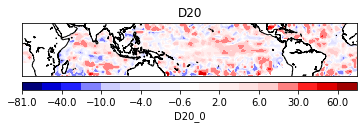

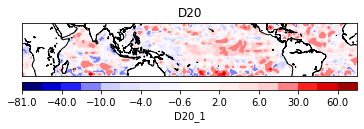

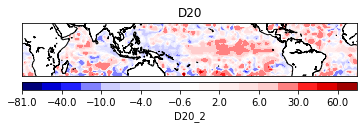

In [ ]:
lab=2
average_teX=np.zeros(teX[0,:,:,:].shape)
for i in range(144):
  for j in range(24):
    average_teX[i,j,0]=teX[ISMR.loc[ISMR['labels']==lab].index,i,j,0].mean()
    average_teX[i,j,1]=teX[ISMR.loc[ISMR['labels']==lab].index,i,j,1].mean()
    average_teX[i,j,2]=teX[ISMR.loc[ISMR['labels']==lab].index,i,j,2].mean()


input_file=np.zeros((24,144,3), dtype=np.float32)
input_file[:,:,0]=np.flipud(np.transpose(average_teX[:,:,0]))
input_file[:,:,1]=np.flipud(np.transpose(average_teX[:,:,1]))
input_file[:,:,2]=np.flipud(np.transpose(average_teX[:,:,2]))

teX_flip=ma.masked_values(input_file, 0)
teX_flip.shape

mean_teX=teX_flip.mean()
std_teX=teX_flip.std()

for j in range(3):
  %matplotlib inline
  lons,lats= np.meshgrid(lon,lat) # for this dataset, longitude is 0 through 360, so you need to subtract 180 to properly display on map
  x,y = m(lons,lats)


  m.drawcoastlines()
  #levels = np.linspace(min(np.unique(teX_flip)),max(np.unique(teX_flip)),5)
  levels=[-81,-60,-40,-30,-10,-6,-4,-2,-.6,+.6,+2,+4,+6,+10,+30,+40,+60,+81]
  temp = m.contourf(x,y,teX_flip[:,:,j],levels=levels,cmap='seismic')
  cb = m.colorbar(temp,"bottom", size="15%", pad="10%")
  #m.drawcoastlines()
  plt.title('D20')
  cb.set_label('D20_'+str(j))
  plt.show()
  #plt.savefig('Sample'+str(i)+'_'+str(j)+'_label_'+str(lab)+'.jpg')
  #files.download('Sample'+str(i)+'_'+str(j)+'_label_'+str(lab)+'.jpg')

#Label-wise mean data plot (Optimum Data)

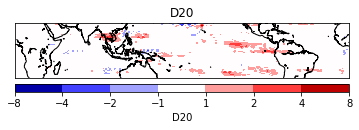

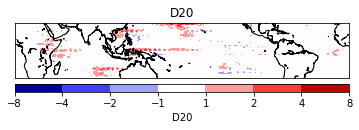

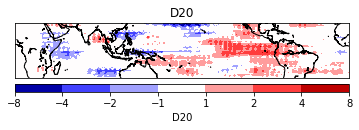

In [ ]:
lab=0
average_teX=np.zeros(teX[0,:,:,:].shape)
for i in range(144):
  for j in range(48):
    average_teX[i,j,0]=opt_test[ISMR.loc[ISMR['labels']==lab].index,i,j,0].mean()
    average_teX[i,j,1]=opt_test[ISMR.loc[ISMR['labels']==lab].index,i,j,1].mean()
    average_teX[i,j,2]=opt_test[ISMR.loc[ISMR['labels']==lab].index,i,j,2].mean()


input_file=np.zeros((48,144,3), dtype=np.float32)
input_file[:,:,0]=np.flipud(np.transpose(average_teX[:,:,0]))
input_file[:,:,1]=np.flipud(np.transpose(average_teX[:,:,1]))
input_file[:,:,2]=np.flipud(np.transpose(average_teX[:,:,2]))

teX_flip=ma.masked_values(input_file, 0.0)
teX_flip.shape

mean_teX=teX_flip.mean()
std_teX=teX_flip.std()

for j in range(3):
  %matplotlib inline
  lons,lats= np.meshgrid(lon,lat) # for this dataset, longitude is 0 through 360, so you need to subtract 180 to properly display on map
  x,y = m(lons,lats)


  m.drawcoastlines()
  #levels = np.linspace(min(np.unique(teX_flip)),max(np.unique(teX_flip)),5)
  levels=[-8.0 , -4.0, -2.0 ,-1.0 ,+1.0 ,+2.0 ,+4.0 ,+8.0]
  temp = m.contourf(x,y,teX_flip[:,:,j],levels=levels,cmap='seismic')
  cb = m.colorbar(temp,"bottom", size="15%", pad="10%")
  #m.drawcoastlines()
  plt.title('D20')
  cb.set_label('D20')
  plt.show()
  #plt.savefig('Sample'+str(i)+'_'+str(j)+'_label_'+str(lab)+'.jpg')
  #files.download('Sample'+str(i)+'_'+str(j)+'_label_'+str(lab)+'.jpg')

In [ ]:
!pip install eofs

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 1.0 MB 7.6 MB/s 
  Created wheel for eofs: filename=eofs-1.4.0-py3-none-any.whl size=1100374 sha256=81cd1f430f4e871bd8a7fc0c46caa50b56d4cd8df7c55a47cb00e16b1b4bac91
  Stored in directory: /root/.cache/pip/wheels/ce/4e/36/2ef48d7342cd326d5f3bdb4ddd0441f06b387b5cbfc8336095
Successfully built eofs


#Difference plot for mean given opt data, labelwise

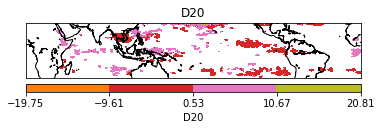

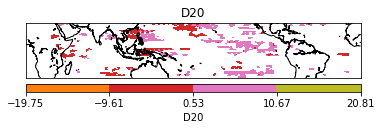

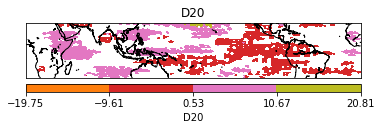

In [ ]:
import matplotlib.cm as cm
lab=2
opt_test=np.load('opt_test_10.npy', allow_pickle=True)

mean_opt=np.mean(opt_test)
std_opt=np.std(opt_test)

mean_teX=teX.mean()
std_teX=teX.std()

average_teX=np.zeros(teX[0,:,:,:].shape)
for i in range(144):
  for j in range(48):
    average_teX[i,j,0]=((teX[ISMR.loc[ISMR['labels']==lab].index,i,j,0]-mean_teX)/std_teX).mean()
    average_teX[i,j,1]=((teX[ISMR.loc[ISMR['labels']==lab].index,i,j,1]-mean_teX)/std_teX).mean()
    average_teX[i,j,2]=((teX[ISMR.loc[ISMR['labels']==lab].index,i,j,2]-mean_teX)/std_teX).mean()
given_teX=average_teX

average_teX=np.zeros(teX[0,:,:,:].shape)
for i in range(144):
  for j in range(48):
    average_teX[i,j,0]=((opt_test[ISMR.loc[ISMR['labels']==lab].index,i,j,0]-mean_opt)/std_opt).mean()
    average_teX[i,j,1]=((opt_test[ISMR.loc[ISMR['labels']==lab].index,i,j,1]-mean_opt)/std_opt).mean()
    average_teX[i,j,2]=((opt_test[ISMR.loc[ISMR['labels']==lab].index,i,j,2]-mean_opt)/std_opt).mean()

opt_teX=average_teX
diff_teX=given_teX-opt_teX

input_file=np.zeros((48,144,3), dtype=np.float32)
input_file[:,:,0]=np.flipud(np.transpose(diff_teX[:,:,0]))
input_file[:,:,1]=np.flipud(np.transpose(diff_teX[:,:,1]))
input_file[:,:,2]=np.flipud(np.transpose(diff_teX[:,:,2]))

teX_flip=ma.masked_where(np.abs(input_file)<np.std(np.abs(input_file)),input_file)
teX_flip.shape

mean_teX=teX_flip.mean()
std_teX=teX_flip.std()

for j in range(3):
  %matplotlib inline
  lons,lats= np.meshgrid(lon,lat) # for this dataset, longitude is 0 through 360, so you need to subtract 180 to properly display on map
  x,y = m(lons,lats)


  m.drawcoastlines()
  levels = np.linspace(min(np.unique(teX_flip)),max(np.unique(teX_flip)),5)
  temp = m.contourf(x,y,teX_flip[:,:,j],levels=levels,cmap='tab10')
  cb = m.colorbar(temp,"bottom", size="15%", pad="10%")
  #m.drawcoastlines()
  plt.title('D20')
  cb.set_label('D20')
  plt.show()
  #plt.savefig('Sample'+str(i)+'_'+str(j)+'_label_'+str(lab)+'.jpg')
  #files.download('Sample'+str(i)+'_'+str(j)+'_label_'+str(lab)+'.jpg')

#Difference between the mean plots of label-wise maps for given data

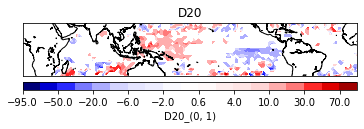

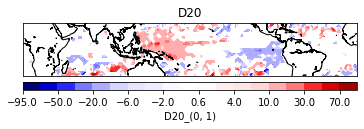

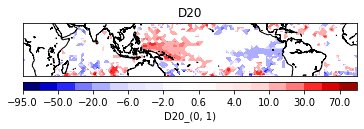

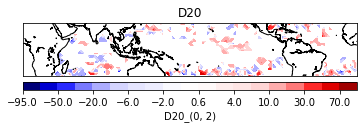

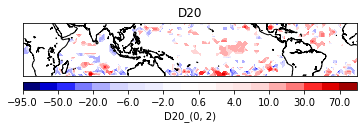

...

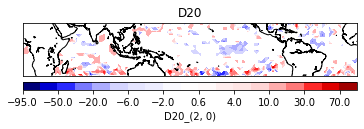

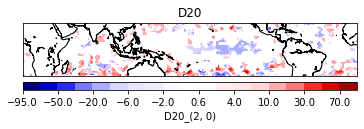

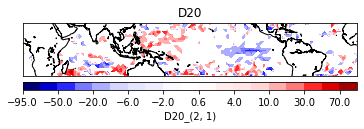

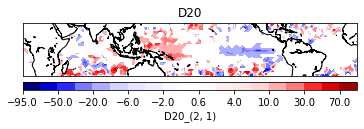

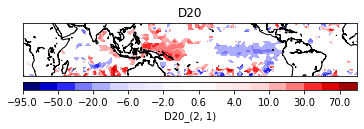

In [ ]:
from itertools import permutations

label_comb=[]
for i in permutations([0,1,2], 2):
    label_comb.append(i)

average_teX=np.zeros(teX[0,:,:,:].shape)
teX_flip=[]

for (lab1,lab2) in label_comb:
  average_teX=np.zeros(teX[0,:,:,:].shape)
  for i in range(144):
    for j in range(24):
      average_teX[i,j,0]=teX[ISMR.loc[ISMR['labels']==lab1].index,i,j,0].mean()
      average_teX[i,j,1]=teX[ISMR.loc[ISMR['labels']==lab1].index,i,j,1].mean()
      average_teX[i,j,2]=teX[ISMR.loc[ISMR['labels']==lab1].index,i,j,2].mean()

  before_teX=average_teX

  average_teX=np.zeros(teX[0,:,:,:].shape)
  for i in range(144):
    for j in range(24):
      average_teX[i,j,0]=teX[ISMR.loc[ISMR['labels']==lab2].index,i,j,0].mean()
      average_teX[i,j,1]=teX[ISMR.loc[ISMR['labels']==lab2].index,i,j,1].mean()
      average_teX[i,j,2]=teX[ISMR.loc[ISMR['labels']==lab2].index,i,j,2].mean()

  after_teX=average_teX

  diff_teX=after_teX-before_teX
  input_file=np.zeros((24,144,3), dtype=np.float32)
  input_file[:,:,0]=np.flipud(np.transpose(diff_teX[:,:,0]))
  input_file[:,:,1]=np.flipud(np.transpose(diff_teX[:,:,1]))
  input_file[:,:,2]=np.flipud(np.transpose(diff_teX[:,:,2]))

  #teX_flip=ma.masked_values(input_file, 0)
  #teX_flip=ma.masked_where(np.abs(input_file)<np.std(np.abs(input_file)),input_file)
  #teX_flip.shape
  teX_flip.append(input_file)

teX_flip=np.array(teX_flip)
for i in range(len(teX_flip)):
  for j in range(3):
    %matplotlib inline
    lons,lats= np.meshgrid(lon,lat) # for this dataset, longitude is 0 through 360, so you need to subtract 180 to properly display on map
    x,y = m(lons,lats)


    m.drawcoastlines()
    #levels = np.linspace(min(np.unique(teX_flip)),max(np.unique(teX_flip)),5)
    levels=[-95,-70,-50,-30,-20,-10,-6,-4,-2,-.6,+.6,+2,+4,+6,+10,+20,+30,+50,+70,+95]
    temp = m.contourf(x,y,ma.masked_where(np.abs(teX_flip[i,:,:,j])<np.std(np.abs(teX_flip[i,:,:,j])),teX_flip[i,:,:,j]),levels=levels,cmap='seismic')
    cb = m.colorbar(temp,"bottom", size="15%", pad="10%")


    #m.drawcoastlines()
    plt.title('D20')
    cb.set_label('D20_'+str(label_comb[i]))
    plt.show()
    # plt.savefig('Mean_Sample_D20_'+str(lab2)+'-'+str(lab1)+'.jpg')
    # files.download('Mean_Sample_D20_'+str(lab2)+'-'+str(lab1)+'.jpg')

#Difference between the mean plots of label-wise maps for optimised data

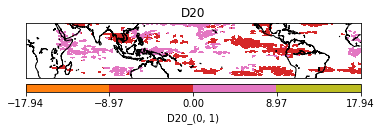

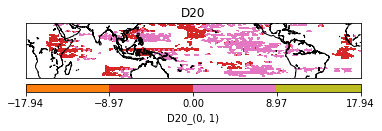

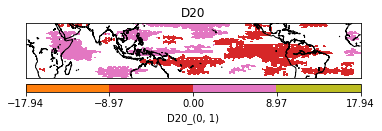

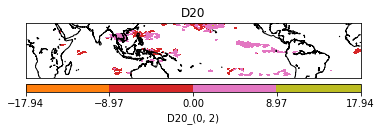

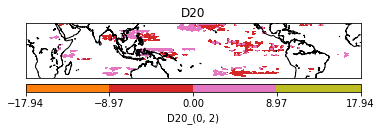

...

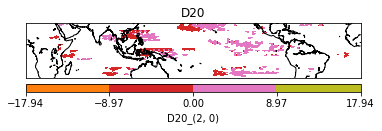

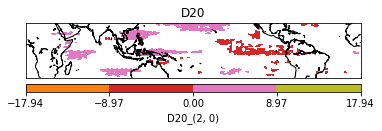

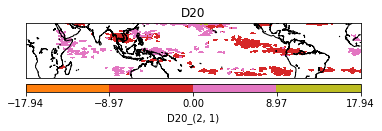

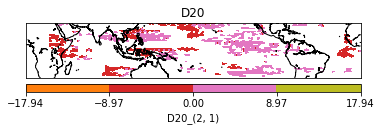

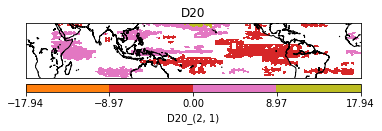

In [ ]:
from itertools import permutations
label_comb=[]
for i in permutations([0,1,2], 2):
    label_comb.append(i)

average_teX=np.zeros(teX[0,:,:,:].shape)

teX_flip=[]
for (lab1,lab2) in label_comb:
  average_teX=np.zeros(teX[0,:,:,:].shape)
  for i in range(144):
    for j in range(48):
      average_teX[i,j,0]=opt_test[ISMR.loc[ISMR['labels']==lab1].index,i,j,0].mean()
      average_teX[i,j,1]=opt_test[ISMR.loc[ISMR['labels']==lab1].index,i,j,1].mean()
      average_teX[i,j,2]=opt_test[ISMR.loc[ISMR['labels']==lab1].index,i,j,2].mean()

  before_teX=average_teX

  average_teX=np.zeros(teX[0,:,:,:].shape)
  for i in range(144):
    for j in range(48):
      average_teX[i,j,0]=opt_test[ISMR.loc[ISMR['labels']==lab2].index,i,j,0].mean()
      average_teX[i,j,1]=opt_test[ISMR.loc[ISMR['labels']==lab2].index,i,j,1].mean()
      average_teX[i,j,2]=opt_test[ISMR.loc[ISMR['labels']==lab2].index,i,j,2].mean()

  after_teX=average_teX

  diff_teX=after_teX-before_teX
  input_file=np.zeros((48,144,3), dtype=np.float32)
  input_file[:,:,0]=np.flipud(np.transpose(diff_teX[:,:,0]))
  input_file[:,:,1]=np.flipud(np.transpose(diff_teX[:,:,1]))
  input_file[:,:,2]=np.flipud(np.transpose(diff_teX[:,:,2]))

  #teX_flip=ma.masked_values(input_file, 0)
  #teX_flip=ma.masked_where(np.abs(input_file)<np.std(np.abs(input_file)),input_file)
  #teX_flip.shape
  teX_flip.append(input_file)


teX_flip=np.array(teX_flip)

for i in range(len(teX_flip)):
  for j in range(3):
    %matplotlib inline
    lons,lats= np.meshgrid(lon,lat) # for this dataset, longitude is 0 through 360, so you need to subtract 180 to properly display on map
    x,y = m(lons,lats)


    m.drawcoastlines()
    levels = np.linspace(min(np.unique(teX_flip)),max(np.unique(teX_flip)),5)
    temp = m.contourf(x,y,ma.masked_where(np.abs(teX_flip[i,:,:,j])<np.std(np.abs(teX_flip[i,:,:,j])),teX_flip[i,:,:,j]),levels=levels,cmap='tab10')
    cb = m.colorbar(temp,"bottom", size="15%", pad="10%")


    #m.drawcoastlines()
    plt.title('D20')
    cb.set_label('D20_'+str(label_comb[i]))
    plt.show()

    #plt.savefig('Mean_Sample_D20_'+str(lab2)+'-'+str(lab1)+'.jpg')
    #files.download('Mean_Sample_D20_'+str(lab2)+'-'+str(lab1)+'.jpg')

#Plotting Difference between normalised optimum and normalized given maps

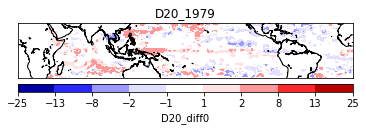

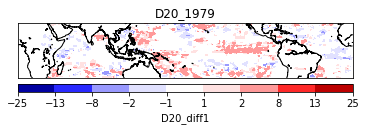

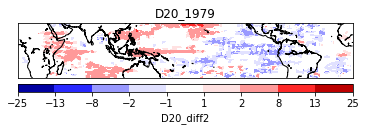

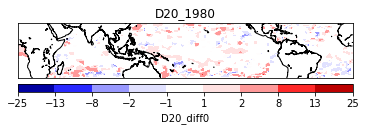

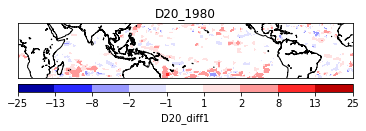

...

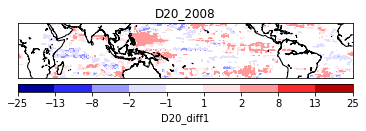

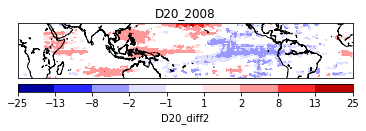

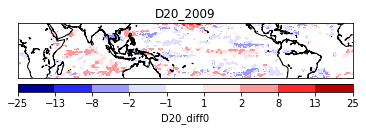

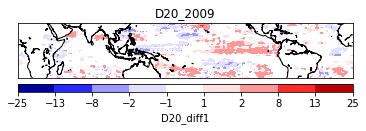

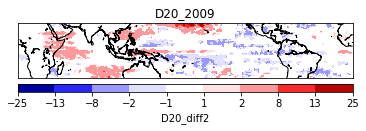

In [ ]:

mean_teX=teX.mean()
std_teX=teX.std()

mean_opt=opt_test.mean()
std_opt=opt_test.std()

teX_flip=[]
for sample in range(len(teX)):


  diff_teX=(teX[sample]-mean_teX)/std_teX-(opt_test[sample]-mean_opt)/std_opt
  input_file=np.zeros((48,144,3), dtype=np.float32)
  input_file[:,:,0]=np.flipud(np.transpose(diff_teX[:,:,0]))
  input_file[:,:,1]=np.flipud(np.transpose(diff_teX[:,:,1]))
  input_file[:,:,2]=np.flipud(np.transpose(diff_teX[:,:,2]))

  #teX_flip=ma.masked_values(input_file, 0)
  teX_flip.append(ma.masked_where(np.abs(input_file)<np.std(np.abs(input_file)),input_file))
  #teX_flip.append(input_file)
  #teX_flip.shape

teX_flip=np.array(teX_flip)

for i in range(len(teX_flip)):
  for j in range(3):
    %matplotlib inline
    lons,lats= np.meshgrid(lon,lat) # for this dataset, longitude is 0 through 360, so you need to subtract 180 to properly display on map
    x,y = m(lons,lats)





    m.drawcoastlines()
    #levels = np.linspace(min(np.unique(teX_flip)),max(np.unique(teX_flip)),5)
    levels=[-25,-13,-8,-2,-1,+1,+2,+8,+13,+25]
    temp = m.contourf(x,y,ma.masked_where(np.abs(teX_flip[i,:,:,j])<np.std(np.abs(teX_flip[i,:,:,j])),teX_flip[i,:,:,j]),levels=levels,cmap='seismic')
    cb = m.colorbar(temp,"bottom", size="15%", pad="10%")


    #m.drawcoastlines()
    plt.title('D20_'+str(i+1979))
    cb.set_label('D20_diff'+str(j))

    plt.savefig('Diff_norm_given_opt/D20_diff'+str(i+1979)+'_'+str(j)+'.jpg')
    plt.show()
    # files.download('Mean_Sample_D20_'+str(lab2)+'-'+str(lab1)+'.jpg')



In [ ]:
!zip -r Diff_norm_given_opt.zip Diff_norm_given_opt/

updating: Diff_norm_given_opt/ (stored 0%)
updating: Diff_norm_given_opt/D20_diff2002_1.jpg (deflated 7%)
updating: Diff_norm_given_opt/D20_diff1995_0.jpg (deflated 7%)
updating: Diff_norm_given_opt/D20_diff1990_0.jpg (deflated 7%)
updating: Diff_norm_given_opt/D20_diff1990_1.jpg (deflated 7%)
updating: Diff_norm_given_opt/D20_diff2002_0.jpg (deflated 7%)
updating: Diff_norm_given_opt/D20_diff2004_2.jpg (deflated 7%)
updating: Diff_norm_given_opt/D20_diff2007_2.jpg (deflated 7%)
updating: Diff_norm_given_opt/D20_diff2009_2.jpg (deflated 7%)
updating: Diff_norm_given_opt/D20_diff1989_0.jpg (deflated 7%)
updating: Diff_norm_given_opt/D20_diff1989_1.jpg (deflated 7%)
updating: Diff_norm_given_opt/D20_diff1983_0.jpg (deflated 7%)
updating: Diff_norm_given_opt/D20_diff1996_0.jpg (deflated 7%)
updating: Diff_norm_given_opt/D20_diff1985_0.jpg (deflated 7%)
updating: Diff_norm_given_opt/D20_diff1987_1.jpg (deflated 7%)
updating: Diff_norm_given_opt/D20_diff1996_1.jpg (deflated 7%)
updating: Di

#Mean Difference

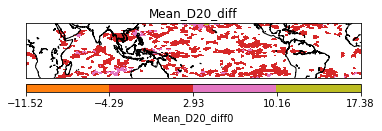

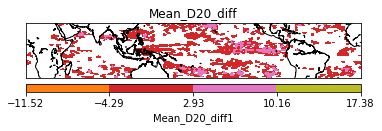

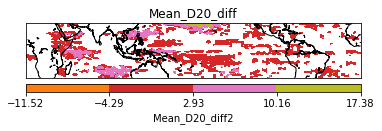

In [ ]:
average_teX=np.zeros(teX_flip[0,:,:,:].shape)

for i in range(48):
  for j in range(144):
    for sample in range(len(teX_flip)):
      average_teX[i,j,0]=teX_flip[sample,i,j,0].mean()
      average_teX[i,j,1]=teX_flip[sample,i,j,1].mean()
      average_teX[i,j,2]=teX_flip[sample,i,j,2].mean()






for i in range(3):
  m.drawcoastlines()
  levels = np.linspace(min(np.unique(average_teX)),max(np.unique(average_teX)),5)
  temp = m.contourf(x,y,ma.masked_where(np.abs(average_teX[:,:,i])<np.std(np.abs(average_teX[:,:,i])),average_teX[:,:,i]),levels=levels,cmap='tab10')
  cb = m.colorbar(temp,"bottom", size="15%", pad="10%")


  #m.drawcoastlines()
  plt.title('Mean_D20_diff')
  cb.set_label('Mean_D20_diff'+str(i))
  #plt.savefig('Diff_norm_given_opt/D20_diff'+str(2010)+'_'+str(i)+'.jpg')
  plt.show()

In [ ]:
teX_flip[0,:,:,:].shape

(48, 144, 3)

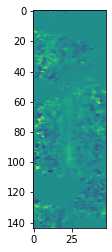

In [ ]:
import matplotlib.pyplot as plt
#teX[0][:,:,0].shape
plt.imshow(teX[0][:,:,0])

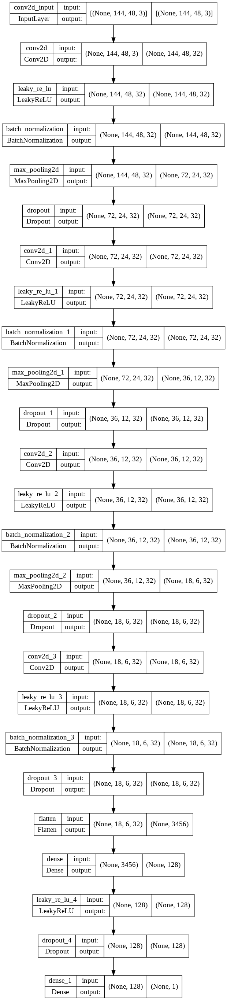

In [ ]:
from tensorflow.keras.utils import plot_model
plot_model(model, 'model.png', show_shapes = True)

#MODEL RETRAINING

In [ ]:
weight=initializers.RandomNormal(stddev=0.1)
bias=initializers.RandomUniform(minval=-0.01, maxval=0.01)


model=Sequential()

inputshape=(144,48,3)

model.add(Conv2D(num_convf, (8,4), strides=(1,1), padding='SAME', kernel_initializer=weight, bias_initializer=bias))
model.add(BatchNormalization())
model.add(LeakyReLU())


model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='SAME'))
model.add(Dropout(0.5))

model.add(Conv2D(num_convf, (4,2), strides=(1,1), padding='SAME', kernel_initializer=weight, bias_initializer=bias))
model.add(BatchNormalization())
model.add(LeakyReLU())


model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='SAME'))
model.add(Dropout(0.5))

model.add(Conv2D(num_convf, (4,2), strides=(1,1),  padding='SAME', kernel_initializer=weight, bias_initializer=bias))
model.add(BatchNormalization())
model.add(LeakyReLU())


model.add(MaxPooling2D(pool_size=(2,2), strides=(2,2), padding='SAME'))
model.add(Dropout(0.5))

model.add(Conv2D(num_convf, (2,2), strides=(1,1), padding='SAME', kernel_initializer=weight, bias_initializer=bias))
model.add(BatchNormalization())
model.add(LeakyReLU())


model.add(Dropout(0.5))

model.add(Flatten())

model.add(Dense(num_hiddf, kernel_initializer=weight, bias_initializer=bias))
model.add(LeakyReLU())
model.add(Dropout(0))

model.add(Dense(1, kernel_initializer=weight, bias_initializer=bias))


opt=Adam(learning_rate=0.001)

model.compile(optimizer=opt, loss='mean_squared_error')

checkpoint_filepath = "Transfer.hdf5"


model_checkpoint_callback = tf.keras.callbacks.EarlyStopping(monitor='loss', patience=5, verbose=1,
                                                             mode='min', restore_best_weights=True)

model.save('Transfer_Model.hdf5')
model.save_weights(checkpoint_filepath)


ValueError: ignored

In [ ]:
model.fit(trainX, trainY, epochs=1, batch_size=16)

7/7 [==============================] - 3s 218ms/step - loss: 18.9993


In [ ]:

model.load_weights('drive/MyDrive/weights/Transfer_10.hdf5')
#model.save_weights(checkpoint_filepath)

In [ ]:
model.save_weights(checkpoint_filepath)

In [ ]:
A

array([[ 0.21113369],
       [-0.74980056],
       [ 1.0515594 ],
       [ 0.07341231],
       [-0.5604732 ],
       [-0.7017353 ],
       [-1.081522  ],
       [ 1.0821337 ],
       [ 0.30070764],
       [ 0.64141244],
       [-0.12034169],
       [-0.1345544 ],
       [ 0.11762606],
       [ 1.028003  ],
       [-0.1058825 ],
       [ 0.1479378 ],
       [ 0.17306893],
       [ 0.20803624],
       [-0.21683294],
       [-0.40071812],
       [-0.33378318],
       [-1.547177  ],
       [ 0.16483949],
       [-0.7764224 ],
       [-0.06850432],
       [ 0.55744636],
       [ 0.89651185],
       [ 0.36098784],
       [-1.1196188 ],
       [ 0.38256162],
       [ 0.5199879 ]], dtype=float32)

In [ ]:
opt_test = np.zeros((((len(A),144,48,3))), dtype=np.float32)

for i in range(len(A)):

    x1 = np.zeros((((1,144,48,3))), dtype=np.float32)
    x1 = tf.Variable(x1)
    y1 = tf.Variable(A[i].reshape(1,1))
    #yp = np.zeros((1,6))

    alpha = 100
    mse = tf.keras.losses.MeanSquaredError()
    loss = 10
    while(loss > 1e-8):

        with tf.GradientTape() as tape:
            # Forward pass
            tape.watch(x1)
            yp = model(x1)
            loss = mse(y1,yp)

        grad = tape.gradient(loss, x1)

        x1 = x1 - alpha*grad

    opt_test[i] = x1.numpy()

In [ ]:
np.save('opt_test_10.npy', opt_test)
files.download('opt_test_10.npy')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#Call BO for all weights

In [ ]:
A=ma.getdata(teY)

for f_no in range(1,10):
  model.load_weights('drive/MyDrive/weights/Transfer_0'+str(f_no)+'.hdf5')
  opt_test = np.zeros((((len(A),144,48,3))), dtype=np.float32)

  for i in range(len(A)):

      x1 = np.zeros((((1,144,48,3))), dtype=np.float32)
      x1 = tf.Variable(x1)
      y1 = tf.Variable(A[i].reshape(1,1))
      #yp = np.zeros((1,6))

      alpha = 100
      mse = tf.keras.losses.MeanSquaredError()
      loss = 10
      while(loss > 1e-8):

          with tf.GradientTape() as tape:
              # Forward pass
              tape.watch(x1)
              yp = model(x1)
              loss = mse(y1,yp)

          grad = tape.gradient(loss, x1)

          x1 = x1 - alpha*grad

      opt_test[i] = x1.numpy()


  np.save('opt_test_0'+str(f_no)+'.npy', opt_test)
  files.download('opt_test_0'+str(f_no)+'.npy')




model.load_weights('drive/MyDrive/weights/Transfer_10.hdf5')
opt_test = np.zeros((((len(A),144,48,3))), dtype=np.float32)

for i in range(len(A)):

    x1 = np.zeros((((1,144,48,3))), dtype=np.float32)
    x1 = tf.Variable(x1)
    y1 = tf.Variable(A[i].reshape(1,1))
    #yp = np.zeros((1,6))

    alpha = 100
    mse = tf.keras.losses.MeanSquaredError()
    loss = 10
    while(loss > 1e-8):

        with tf.GradientTape() as tape:
            # Forward pass
            tape.watch(x1)
            yp = model(x1)
            loss = mse(y1,yp)

        grad = tape.gradient(loss, x1)

        x1 = x1 - alpha*grad

    opt_test[i] = x1.numpy()


np.save('opt_test_10.npy', opt_test)
files.download('opt_test_10.npy')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

for i in range(1,10):
  %matplotlib
  opt_test=np.load('opt_test_0'+str(i)+'.npy', allow_pickle=True)


  model.load_weights('drive/MyDrive/weights/Transfer_0'+str(i)+'.hdf5')
  predY=model.predict(opt_test)

  corr,_=pearsonr(predY.flatten(),teY.flatten())
  plt.scatter((predY-np.mean(predY))/np.std(predY),(teY-np.mean(teY))/np.std(teY))
  plt.xlabel('Predicted rainfall using Optimum dataset')
  plt.ylabel('Given rainfall')
  plt.legend(['correlation='+str(corr)])
  plt.savefig('opt_test_0'+str(i)+'_plot.jpg')
  files.download('opt_test_0'+str(i)+'_plot.jpg')
  plt.show()


opt_test=np.load('opt_test_10.npy', allow_pickle=True)
model.load_weights('drive/MyDrive/weights/Transfer_10.hdf5')
predY=model.predict(opt_test)

corr,_=pearsonr(predY.flatten(),teY.flatten())
plt.scatter((predY-np.mean(predY))/np.std(predY),(teY-np.mean(teY))/np.std(teY))
plt.xlabel('Predicted rainfall using Optimum input')
plt.ylabel('Given rainfall')
plt.legend(['correlation='+str(corr)])

plt.savefig('opt_test_10_plot.jpg')
files.download('opt_test_10_plot.jpg')
plt.show()

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

#Mean of all optimum and given ISMR

In [ ]:
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
predY=[]
for i in range(1,10):

  opt_test=np.load('opt_test_0'+str(i)+'.npy', allow_pickle=True)


  model.load_weights('drive/MyDrive/weights/Transfer_0'+str(i)+'.hdf5')
  predY.append(model.predict(opt_test))


opt_test=np.load('opt_test_10.npy', allow_pickle=True)
model.load_weights('drive/MyDrive/weights/Transfer_10.hdf5')
predY.append(model.predict(opt_test))

meanpredY=[]
predY=np.array(predY)

for predloop in range(predY.shape[1]):
  meanpredY.append(predY[:,predloop,:].mean())

meanpredY=np.array(meanpredY)

corr,_=pearsonr(meanpredY,teY.flatten())
%matplotlib
plt.scatter((meanpredY-np.mean(meanpredY))/np.std(meanpredY),(teY-np.mean(teY))/np.std(teY))
plt.xlabel('Predicted rainfall using Optimum Input')
plt.ylabel('Given rainfall')
plt.legend(['correlation='+str(corr)])
plt.savefig('opt_test_mean_plot.jpg')
files.download('opt_test_mean_plot.jpg')
plt.show()
%matplotlib
plt.plot([i for i in range(1981,2012)],(teY-np.mean(teY))/np.std(teY),label='True values')
plt.plot([i for i in range(1981,2012)],(meanpredY-np.mean(meanpredY))/np.std(meanpredY),label='Predicted values')
plt.xlabel('Years')
plt.ylabel('ISMR')
plt.legend()
#plt.legend(['correlation='+str(corr)])
plt.savefig('graph.jpg')
files.download('graph.jpg')
plt.show()


Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
[i for i in range(1981,2012)]

[1981,
 1982,
 1983,
 1984,
 1985,
 1986,
 1987,
 1988,
 1989,
 1990,
 1991,
 1992,
 1993,
 1994,
 1995,
 1996,
 1997,
 1998,
 1999,
 2000,
 2001,
 2002,
 2003,
 2004,
 2005,
 2006,
 2007,
 2008,
 2009,
 2010,
 2011]

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

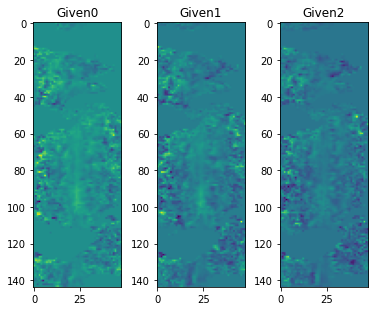

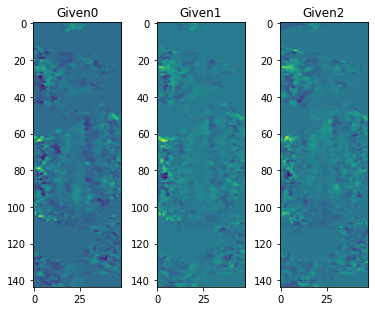

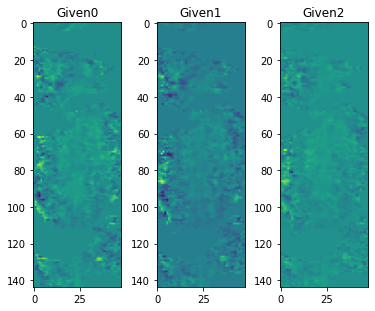

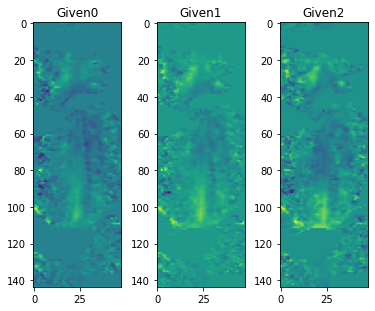

In [ ]:
mean_teX=np.mean(teX)
std_teX=np.std(teX)
for j in range(4):
  fig = plt.figure(figsize=(6, 16))
  fig.subplots_adjust(hspace=0.4, wspace=0.4)
  for i in range(1,4):
      ax = fig.add_subplot(2, 3, i)
      #ax.text(0.5, 0.5, str((2, 3, i)),
            #fontsize=18, ha='center')
      ax.imshow((teX[j,:,:,(i-1)]-mean_teX)/std_teX)
      ax.set_title('Given'+str(i-1))

  plt.savefig('Given Sample'+str(j)+'.jpg')
  files.download('Given Sample'+str(j)+'.jpg')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

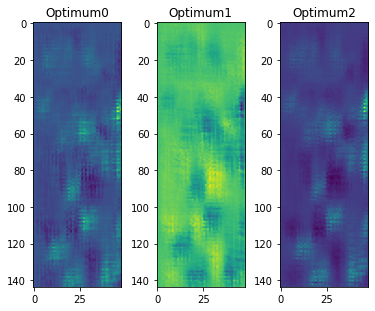

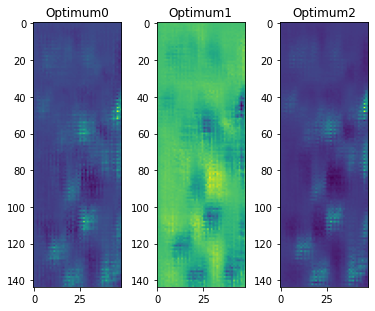

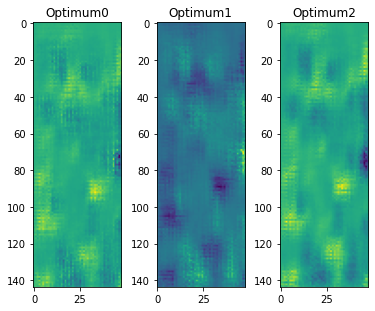

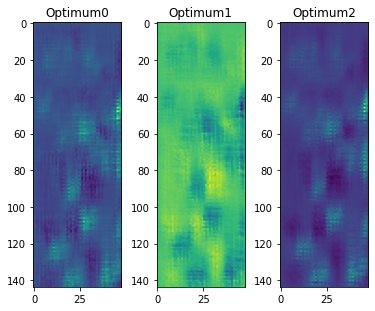

In [ ]:
for j in range(4):
  fig = plt.figure(figsize=(6, 16))
  fig.subplots_adjust(hspace=0.4, wspace=0.4)
  for i in range(1,4):
      ax = fig.add_subplot(2, 3, i)
      #ax.text(0.5, 0.5, str((2, 3, i)),
            #fontsize=18, ha='center')
      ax.imshow(opt_test[j,:,:,(i-1)])
      ax.set_title('Optimum'+str(i-1))

  plt.savefig('Optimum Sample'+str(j)+'.jpg')
  files.download('Optimum Sample'+str(j)+'.jpg')

In [ ]:
import matplotlib.pyplot as plt
from scipy.stats import pearsonr
opt_test=np.load('opt_test_10.npy', allow_pickle=True)

lab=2


for i in ISMR.loc[ISMR['labels']==lab].index:
  for j in range(3):
    %matplotlib
    corr,_=pearsonr(opt_test[i,:,:,j].flatten(),teX[i,:,:,j].flatten())
    plt.xlabel('Optimum Input values')
    plt.ylabel('given values')
    plt.legend(['corr='+str(corr)])
    plt.scatter((opt_test[i,:,:,j]-np.mean(opt_test[i,:,:,j]))/np.std(opt_test[i,:,:,j]),(teX[i,:,:,j]-np.mean(teX[i,:,:,j]))/np.std(teX[i,:,:,j]))
    plt.savefig('Sample_'+str(i)+'_'+str(j)+'.png')
    files.download('Sample_'+str(i)+'_'+str(j)+'.png')
    plt.show()


Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

Using matplotlib backend: agg


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
ISMR.loc[ISMR['labels']==0].index

Int64Index([0, 3, 8, 10, 11, 12, 14, 15, 16, 17, 18, 19, 20, 22, 24, 27, 29], dtype='int64')

In [ ]:
def corr2_coeff(A, B):
    # Rowwise mean of input arrays & subtract from input arrays themeselves
    A_mA = A - A.mean(1)[:, None]
    B_mB = B - B.mean(1)[:, None]

    # Sum of squares across rows
    ssA = (A_mA**2).sum(1)
    ssB = (B_mB**2).sum(1)

    # Finally get corr coeff
    return np.dot(A_mA, B_mB.T) / np.sqrt(np.dot(ssA[:, None],ssB[None]))

In [ ]:
from scipy.stats import pearsonr
import scipy.signal

#model.load_weights(checkpoint_filepath)

#prediction=model.predict(teX)
#prediction=prediction.reshape(31,)
corr_p=[]
#teY=teY.reshape(31,)
for i in range(teX.shape[0]):
  corr=[]
  for j in range(teX.shape[3]):
    corr_coeff,_=pearsonr(opt_test[i,:,:,j].flatten(), teX[i,:,:,j].flatten())
    corr.append(corr_coeff)
  corr_p.append(corr)

print('corr', corr_p)
# print('p value', p)
# print('STD', np.std(opt_test))


corr [[0.051156024882974646, -0.022464460669751777, -0.009050383325207988], [0.021561490418605125, -0.005899308120102696, 0.02737831953767573], [-0.026640473732469548, -0.0340455391152173, 0.006895852745791616], [-0.02522531552577985, 0.04597621571915751, -0.01573217095684941], [0.005296763155589371, -0.018737700557300042, 0.04790045144253023], [0.0026770615544627133, -0.02129490525980991, 0.045512008355773736], [0.020389620373315116, -0.06019638566282526, 0.043330330946504084], [0.015762850842189473, 0.02731894844387417, 0.026696903097904272], [-0.03403765145904215, 0.03855657237750172, -0.022602889936499074], [0.002734379233430881, -0.03294331854867093, 0.0029391866137435194], [0.03661783284039979, -0.011979519832791049, -0.01400411916969371], [-0.020083412935248707, 0.039794099371048004, -0.05084864208480998], [-0.02232040986512266, -0.002158467823855227, -0.03133130745590465], [0.05864351716756719, -0.032809701369238733, 0.04677475429467294], [-0.08742372105042295, 0.08109507479266

In [ ]:
(opt_test[0,:,:,0]).flatten()

array([ 0.00670688,  0.02886224, -0.01775335, ...,  0.07362644,
       -0.48485935, -0.26551625], dtype=float32)

In [ ]:
from scipy.stats import pearsonr
import scipy.signal

for f_no in range(1,10):
  opt_test=np.load('opt_test_0'+str(f_no)+'.npy', allow_pickle=True)

  #model.load_weights(checkpoint_filepath)

  #prediction=model.predict(teX)
  #prediction=prediction.reshape(31,)
  corr_p=[]
  #teY=teY.reshape(31,)
  for i in range(teX.shape[0]):
    corr=[]
    for j in range(teX.shape[3]):
      corr_coeff,_=pearsonr(opt_test[i,:,:,j].flatten(), teX[i,:,:,j].flatten())
      corr.append(corr_coeff)
    corr_p.append(corr)

  print('corr,p', corr_p)
  # print('p value', p)
  # print('STD', np.std(opt_test))
  np.save('corr_p_0'+str(f_no)+'.npy', corr_p)
  files.download('corr_p_0'+str(f_no)+'.npy')



opt_test=np.load('opt_test_10.npy', allow_pickle=True)

#model.load_weights(checkpoint_filepath)

#prediction=model.predict(teX)
#prediction=prediction.reshape(31,)
corr_p=[]
#teY=teY.reshape(31,)
for i in range(teX.shape[0]):
  corr=[]
  for j in range(teX.shape[3]):
    corr_coeff,_=pearsonr(opt_test[i,:,:,j].flatten(), teX[i,:,:,j].flatten())
    corr.append(corr_coeff)
  corr_p.append(corr)

print('corr,p', corr_p)
# print('p value', p)
# print('STD', np.std(opt_test))
np.save('corr_p_10.npy', corr_p)
files.download('corr_p_10.npy')

corr,p [[0.051156024882974646, -0.022464460669751777, -0.009050383325207988], [0.021561490418605125, -0.005899308120102696, 0.02737831953767573], [-0.026640473732469548, -0.0340455391152173, 0.006895852745791616], [-0.02522531552577985, 0.04597621571915751, -0.01573217095684941], [0.005296763155589371, -0.018737700557300042, 0.04790045144253023], [0.0026770615544627133, -0.02129490525980991, 0.045512008355773736], [0.020389620373315116, -0.06019638566282526, 0.043330330946504084], [0.015762850842189473, 0.02731894844387417, 0.026696903097904272], [-0.03403765145904215, 0.03855657237750172, -0.022602889936499074], [0.002734379233430881, -0.03294331854867093, 0.0029391866137435194], [0.03661783284039979, -0.011979519832791049, -0.01400411916969371], [-0.020083412935248707, 0.039794099371048004, -0.05084864208480998], [-0.02232040986512266, -0.002158467823855227, -0.03133130745590465], [0.05864351716756719, -0.032809701369238733, 0.04677475429467294], [-0.08742372105042295, 0.081095074792

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

corr,p [[0.05808022665900797, -0.0785375275074099, 0.059133840246100106], [-0.027695949924180386, 0.04477492524039552, -0.026532855771675974], [0.024736866881881526, -0.019177217689239644, 0.005911362724500669], [0.01178909465768876, -0.049141746207421136, 0.032022850434616855], [-0.07234387708145884, 0.07509885574398367, -0.07117135019839924], [-0.09172124025762587, 0.09412689084368843, -0.09681105057290798], [0.048150121662383055, -0.046312330024291165, 0.04941349568747379], [0.017259017735546126, 0.0040317276148164535, 0.002781767679326432], [-0.008400870651935025, 0.039189874662923015, -0.048626190347785744], [-0.06467405084121522, 0.07041610625344441, -0.057870377954066125], [-0.005479580340583414, -0.038556796149258124, 0.05366256470729676], [0.07530320705334326, -0.060983893983918125, 0.10604675605342082], [0.10166555203189259, -0.08899757426380576, 0.08080467785021697], [0.016168218443643242, -0.017440355123060663, 0.04495121618807185], [0.036197309697423304, -0.023708421133260

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

corr,p [[-0.11101573995112647, 0.09738410271475322, -0.11024705348754177], [-0.01997209036598604, 0.029264231458279506, -0.027397849078069296], [0.02815074811397407, -0.019880849193636363, 0.0017107244144933796], [-0.0697633154443361, 0.07546774155633307, -0.05146809263839422], [0.07735534849120285, -0.06676740684775315, 0.0924260075002395], [0.09745780669079188, -0.09038452904245466, 0.09438446895388797], [0.03262121364220003, -0.02682779028921594, 0.05193273196340172], [0.0028803530030438586, 0.027589663215516275, -0.021202863724672984], [0.03416387724621195, -0.05302044632183494, 0.06312818107319976], [0.04627714903354258, -0.08112137163475844, 0.058855127220439576], [0.01684892107099688, -0.003999601786256031, -0.0327139938392671], [-0.07223207501199416, 0.0407698314565333, -0.09604688409371284], [-0.06745981336472708, 0.03401648833635937, -0.056618929233543516], [-0.018852510070095266, -0.0004941786633215692, 0.009760021236763273], [-0.005165271087349817, 0.007066862256219806, 0.0

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

corr,p [[0.04838842640964494, 0.02889090940241204, -0.0075313235509195655], [0.06881558090787673, -0.018464884116974698, 0.07850026740234256], [-0.014463986925086813, -0.005719560545440324, -0.011200390010319672], [0.06691567524756979, 0.0035931379269083553, -0.05581550295744237], [-0.09893459876853206, 0.009982897949401237, 0.031100760188283335], [-0.10590353755593074, 0.04414055758170849, 0.008875103370305634], [-0.025569174139213273, -0.033022782906210746, 0.05542717754450893], [-0.00023877671510548135, 0.02718853333660136, 0.030783395990590122], [0.031655386837582566, -0.020832687394922385, 0.02178224147955125], [0.012417555077520737, 0.017593388899563335, -0.034867209763351927], [-0.0161229767134198, -0.0025106049515817176, -0.010899708933553048], [0.015489533043912252, -0.03010670985484501, -0.031656486456310626], [0.051380895490235196, -0.030143946719179082, -0.03953608072717175], [0.03432146262926139, -0.03470127289927572, 0.057141575636252814], [-0.03716478065802573, 0.0307832

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

corr,p [[-0.07177996275740385, 0.09930510361944687, -0.1067673265359578], [0.037932046716933676, -0.009830225107172866, 0.017039686059699584], [0.047260344710227636, -0.06878800637362309, 0.0593509880754608], [-0.023891926766089762, 0.05444978313878242, -0.08782434587876788], [0.006313609011206766, -0.017967760692950894, 0.05584780251169296], [0.016403540235805696, -0.006786022910688163, 0.018968042550021394], [0.04644928891623462, -0.05500002517427054, 0.07700342265154086], [-0.04614309984185033, 0.05990592118057861, -0.05249563513276727], [0.0022604549304969294, -0.0276465393539857, 0.04297700655408257], [-0.05026211261580053, 0.060077321983445765, -0.06743823046873357], [0.014575774561050886, -0.012981118485643763, -0.023396080594377817], [0.0007953179976893765, -0.024493877287982982, -0.03788980928576744], [-0.009992994698783644, 0.01666987366458824, -0.0315869997598046], [0.0002131231808526375, 0.001858883745409606, 0.02427774118717511], [-0.038103238779804566, 0.01912593616455927

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

corr,p [[0.002738692950640223, -0.0026653140347863667, 0.03829534084257726], [0.02368287761075059, -0.009457681289718096, 0.045554913616531426], [-0.04190907310680528, -0.004330824913957944, 0.004692512497845353], [0.03448822801093788, -0.06597787785344159, 0.05693709176107959], [-0.04338432699360926, -0.019810907064019605, 0.0024097521333823375], [0.026909329611589247, -0.03424754489941102, 0.056469678268171716], [0.05204081524576701, -0.06386834634775558, 0.0922253392271942], [0.0006577995135173549, -0.01554811524246469, -0.01266334331390378], [0.06535866002128818, -0.051844646152097204, 0.008016479006417965], [-0.010232386281617541, 0.03266504199069448, 0.014242882245297322], [-0.008980672696289485, 0.02617905299396804, 0.0016437352230026289], [0.007124708132163461, 0.04629095823432419, 0.05594868734666521], [0.0188470257915279, -0.013675591948478165, 0.04949331888467902], [0.032838258956290146, -0.009274298960085888, 0.040173499662249604], [0.0072454809613123165, -0.041600920808462

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

corr,p [[0.05991642205187786, -0.06058580192909614, 0.07766898908092643], [0.029296336006344813, -0.014696685434726598, 0.00622549258687579], [-0.018274174474521992, -0.009852150373863831, 0.03351782342423701], [0.08766658821734197, -0.1043123774091349, 0.07447917895797229], [0.0625717262052729, -0.06712124967374695, 0.11452746258416313], [0.10813941976010827, -0.08299401908235979, 0.07584717829090956], [0.026932165057424108, -0.054014971575257996, 0.032441740598696735], [0.020688817776341142, -0.016297656514022, 0.03725994369162561], [-0.008940530868612823, 0.004396596044522476, -0.05225710483034245], [-0.06849704103052276, 0.09326281310322565, -0.07155061903237403], [-0.01386387374142703, 0.014987198327813521, -0.09026077891861536], [-0.05302826792253732, 0.016414823230192485, -0.061145919868360925], [0.08737055810225994, -0.0611888608210667, 0.06168433117517179], [-0.037033789337796316, 0.012866042124999769, 0.010803110727970485], [-0.02846686198380413, 0.009484087838730363, -0.0120

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

corr,p [[0.021699391461101104, -0.029926781070330838, 0.008657654917734528], [-0.019636080378418706, 0.01020186136444231, -0.009477214685129909], [-0.003758037720818468, -0.018535471579043825, 0.027818054712774827], [0.028802223463508872, -0.06183406847235899, 0.025431774987612413], [-0.014080442214046217, 0.035614625613353046, -0.07502646825262478], [-0.06864100937541881, 0.05618314519035199, -0.08188797147552987], [-0.02320264580459215, 0.04378161175224817, -0.04249668597318754], [0.04359796432932948, -0.022154989980315565, 0.06380968732414455], [0.022214987001391392, 0.03004167696957204, -0.02867371386397773], [-0.05788843381223974, 0.08109456497149747, -0.10972769450712996], [-0.008522444268290363, -0.015088997965485695, 0.029859893538836467], [0.06641572524403312, -0.05412777847358749, 0.10399847244595065], [0.06335610251600406, -0.059099123636009644, 0.08493276932860744], [0.027078608324107505, -0.016032538500830827, 0.06554606434530272], [-0.0013204284316838065, -0.0041885962711

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

corr,p [[0.021092875156820446, -0.0014380691475515007, -0.041624287842087715], [-0.012315018637148104, 0.022022916942602458, -0.0169765832580503], [-0.0066224792697010745, 0.037339035905723, -0.0435083578106027], [0.085983615360158, -0.11970560104612324, 0.10380987475770642], [0.019014643829902717, 0.010285806515695349, 0.018906121798087868], [-0.045694625656038046, 0.07808703005521037, -0.02738851675492556], [-0.020867363293317228, 0.007974595358802891, 0.0067628512238812315], [0.002432293817460612, -0.03279370553117079, -0.0002781611570465527], [0.050207054932465946, -0.04457515617066492, 0.034677745050809464], [-0.05715157069103102, 0.0637561849787687, -0.05826441769700088], [-0.05612799919098532, 0.08389894724556068, -0.03870269109291268], [-0.025953661158700334, 0.01849440507529021, -0.06421182662704648], [0.005860128119845076, -0.06286004314506287, 0.06322639622601231], [-0.01622646088865474, 0.00610933108645818, -0.009966074691670322], [-0.019095464621392028, 0.01384231713943834

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

corr,p [[0.019211757158697752, 0.01132434740117648, 0.016266174520572375], [0.0048261438927674465, -0.003711458264115717, -0.061099076878358805], [-0.004266284901112324, 0.041876368700593754, -0.00377104975130601], [0.025124032920504896, -0.05226649945549485, 0.13687800547966544], [0.01601066859251112, -0.008024974351270642, -0.0470078475709449], [-0.04240277373630966, 0.04383318385857274, -0.12049412271307436], [0.007320029699742628, -0.01751392175739079, 0.08729295129630235], [-0.00031905838863789324, -0.019852471801915263, 0.08710106167413476], [0.010637468901575296, 0.020575364674545665, 0.009224651803995487], [-0.03923971778217057, 0.01957284189264301, -0.18974212625761888], [-0.01814740350264874, 0.0006503882464269778, 0.02493747931346865], [0.017641380512239725, 0.024656704176967636, 0.0923061132200263], [0.04065112327221038, -0.05358181604585648, 0.13234651162916072], [0.017684986665021423, -0.002780681477355577, 0.10003085490586741], [0.027597105544574493, -0.03687507781236508

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
#np.argmax(np.abs(corr_p[0][0]),axis=0)
corr_p=np.load('corr_p_01.npy', allow_pickle=True)
#np.array(corr_p)[0,0,np.argmax(np.abs(corr_p[0][0]),axis=0),np.arange(np.array(corr_p)[0][0].shape[1])]

array([-0.59675159, -0.48142975, -0.44727416, -0.40505005, -0.52190992,
               nan,         nan,         nan,         nan,         nan,
               nan,         nan,         nan,  0.31381168, -0.40735022,
       -0.33532185, -0.48596512, -0.45958413, -0.50456399, -0.46616698,
        0.49774984,  0.58579181,  0.57121966,  0.75893602,  0.77428038,
       -0.5490178 ,  0.48565047, -0.48648093,  0.53832512,  0.50382605,
       -0.60434262,  0.61064743,  0.42267187, -0.42908982,  0.27214031,
        0.36860126, -0.52752312,  0.45284293,  0.30850923,  0.49474011,
       -0.34985192,  0.32698044, -0.38901841, -0.42623101, -0.61330347,
       -0.46249456, -0.58450432, -0.33719811,  0.4931245 ,  0.50115856,
        0.46585012,  0.4506762 ,  0.48324852,  0.72210981,  0.62681655,
        0.58175644, -0.50309099, -0.43129475,  0.4443317 , -0.50483614,
       -0.35350095, -0.49773666,  0.50829572, -0.63821899,  0.47315067,
       -0.68505633,  0.40612651,  0.41248356,  0.37458149,  0.40

In [ ]:
np.argmax(np.array(np.abs(corr_p[0][0])),axis=0)

array([  1,  31,  58,   3,  24,   0,   0,   0,   0,   0,   0,   0,   0,
         3, 141,  39, 140,  45, 140, 140, 140, 140,  97,  95,  93,  15,
       118,   2,  95, 140, 140,  16, 132, 140, 131, 131, 140,  93, 126,
        39, 131, 123, 126,   5,  97, 131,  47,  13, 108,  48,  40,  81,
        16,   9,  77,  95,  25,  17,  83,  25,   5,  90,  92,  41,  89,
       123,  49,   2,  27,  30,  30,  75,  38,   7,  40,  56,  95, 122,
        75,  39, 108,  92,  49,  38,  66, 108,  36,  39,  33,  25,  33,
        29,  57, 125, 116, 115, 108, 143, 143, 111,  29, 107, 142,  94,
        96,  11, 134,  45,  71,  45,  80,  19,  72,  48,  48,  68,  77,
        84,  47,  40,  41,  75,  47,  77,  96,  80,  92,   3, 135,  41,
        41, 140,   7,   7,   9,   5,   9,  92,  92, 133,  90,  66,  41,
        66])

In [ ]:
import sys
np.set_printoptions(threshold=sys.maxsize)
np.array(np.abs(corr_p[0][0]))

array([[4.15381369e-01, 5.75098856e-02, 3.83058779e-01, 1.63756803e-01,
        3.01580945e-01,            nan,            nan,            nan,
                   nan,            nan,            nan,            nan,
                   nan, 3.42972059e-02, 4.29742641e-02, 1.24172164e-01,
        1.61425332e-01, 1.44388390e-01, 2.83955161e-05, 1.66853072e-01,
        3.13919679e-02, 1.14148835e-01, 3.25901995e-01, 3.09855458e-01,
        2.49866811e-01, 1.36844340e-01, 1.34384413e-01, 9.16377538e-02,
        1.73914929e-01, 1.94509305e-01, 1.24297041e-01, 3.48259112e-01,
        2.99625085e-01, 2.52458473e-01, 1.22113907e-01, 9.93778098e-02,
        1.92226531e-01, 1.21241266e-01, 1.25161127e-02, 1.08929071e-01,
        1.87161503e-01, 1.69749021e-01, 1.52146130e-01, 1.17511713e-01,
        2.02337328e-01, 4.01757222e-01, 1.85682008e-01, 1.74920449e-01,
        1.83763369e-01, 6.18544310e-02, 1.24075990e-01, 5.72948600e-02,
        5.05665007e-03, 2.64215619e-01, 1.91673815e-01, 1.370336

In [ ]:
def percentage_error(actual, predicted):
    res = np.empty(actual.shape)
    for j in range(actual.shape[0]):
        if ((actual[j] != 0)):
            res[j] = (actual[j] - predicted[j]) / actual[j]
        else:
            res[j] = predicted[j] / np.mean(actual)


    return res

def mean_absolute_percentage_error(y_true, y_pred):
    return np.mean(np.abs(percentage_error(np.asarray(y_true), np.asarray(y_pred)))) * 100

In [ ]:
from sklearn.metrics import mean_squared_error
import scipy.signal
#from sklearn.metrics import mean_absolute_percentage_error

#model.load_weights(checkpoint_filepath)

#prediction=model.predict(teX)
#prediction=prediction.reshape(31,)
mse=[]
#teY=teY.reshape(31,)
for i in range(teX.shape[0]):
  temp=[]
  for j in range(teX.shape[3]):
    temp.append(mean_absolute_percentage_error(teX[i,:,:,j].flatten(),opt_test[i,:,:,j].flatten()))
  mse.append(temp)


print('mape', mse)
# print('p value', p)
# print('STD', np.std(opt_test))

mape [[165.0747562169915, 382389513584.7799, 418308611898.5164], [2570082349604.156, 80.55194395765803, 109.45227596344702], [66.9754044013467, 68.47990432301287, 70.44112664351618], [138.25830932014318, 91985879100984.19, 94.4319170679201], [79.31826095563314, 98.65210474844172, 132.065524548115], [90.88750886915884, 86.41524722993498, 99.70341839874187], [311.69682559624175, 582621047613.9548, 299.84603833628086], [70.32728859584783, 54201776426.44838, 75.35356769308743], [39564792500.41189, 1717467636703.093, 122.53912037596749], [70.11310016033443, 75.541989062122, 133.25869279919408], [83.82081224417423, 97.3663727401095, 93.94990380814087], [167.73402317907141, 24442.608461566528, 314.55476350835914], [103.80601157329612, 122.86733605378896, 111.88831617015087], [265298435861.3873, 70.6280462594712, 72.88497597584552], [595566531401.4447, 86.01082707272644, 125.04112861521273], [87.42805121686096, 102.6488649822878, 217.36301322301065], [287.2464671355512, 105.09107950883035, 564

In [ ]:
#!pip install update tensorflow==2.8
import tensorflow as tf
print(tf.__version__)

2.8.0


In [ ]:
corrval=[]
for i in range(len(corr_p)):
  temp=[]
  for j in range(3):
    temp.append(((abs(np.array(corr_p)[i,j,:,:])>=.36)==True))
  corrval.append(temp)

In [ ]:
corrval

[[array([[ True, False,  True, ..., False, False, False],
         [ True, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [False, False, False, ..., False,  True, False],
         [False, False,  True, ..., False,  True, False],
         [False, False, False, ..., False,  True, False]]),
  array([[False, False,  True, ..., False, False, False],
         [False, False,  True, ..., False, False, False],
         [False, False,  True, ..., False, False, False],
         ...,
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False]]),
  array([[False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         [False, False, False, ..., False, False, False],
         ...,
         [ True,  True, False, ..., False, False,  True],
         [False, False, Fa

In [ ]:
np.array(corr_p).shape[-1]*np.array(corr_p).shape[-2]

27265